<hr style="height: 1px;">
<i>This notebook was authored by the 8.S50x Course Team, Copyright 2022 MIT All Rights Reserved.</i>
<hr style="height: 1px;">
<br>

<h1>Lesson 17: Numerical ODE Simulations Part I</h1>


<a name='section_17_0'></a>
<hr style="height: 1px;">


## <h2 style="border:1px; border-style:solid; padding: 0.25em; color: #FFFFFF; background-color: #90409C">L17.0 Overview</h2>


<h3>Navigation</h3>

<table style="width:100%">
    <tr>
        <td style="text-align: left; vertical-align: top; font-size: 10pt;"><a href="#section_17_1">L17.1 Simulating a Pendulum</a></td>
        <td style="text-align: left; vertical-align: top; font-size: 10pt;"><a href="#exercises_17_1">L17.1 Exercises</a></td>
    </tr>
    <tr>
        <td style="text-align: left; vertical-align: top; font-size: 10pt;"><a href="#section_17_2">L17.2 The Symplectic Approach</a></td>
        <td style="text-align: left; vertical-align: top; font-size: 10pt;"><a href="#exercises_17_2">L17.2 Exercises</a></td>
    </tr>
    <tr>
        <td style="text-align: left; vertical-align: top; font-size: 10pt;"><a href="#section_17_3">L17.3 The Leap-Frog Verlet Approach</a></td>
        <td style="text-align: left; vertical-align: top; font-size: 10pt;"><a href="#exercises_17_3">L17.3 Exercises</a></td>
    </tr>
    <tr>
        <td style="text-align: left; vertical-align: top; font-size: 10pt;"><a href="#section_17_4">L17.4 Runge-Kutta</a></td>
        <td style="text-align: left; vertical-align: top; font-size: 10pt;"><a href="#exercises_17_4">L17.4 Exercises</a></td>
    </tr>
    <tr>
        <td style="text-align: left; vertical-align: top; font-size: 10pt;"><a href="#section_17_5">L17.5 Modern High Quality Integrators</a></td>
        <td style="text-align: left; vertical-align: top; font-size: 10pt;"><a href="#exercises_17_5">L17.5 Exercises</a></td>
    </tr>
    <tr>
        <td style="text-align: left; vertical-align: top; font-size: 10pt;"><a href="#section_17_6">L17.6 Fitting the Full Thing</a></td>
        <td style="text-align: left; vertical-align: top; font-size: 10pt;"><a href="#exercises_17_6">L17.6 Exercises</a></td>
    </tr>
</table>

In [2]:
#>>>RUN: L17.0-runcell00

#Importing data:

!git init
!git remote add -f origin https://github.com/mitx-8s50/nb_LEARNER/
!git config core.sparseCheckout true
!echo 'data/L17' >> .git/info/sparse-checkout
!git pull origin main

Reinitialized existing Git repository in /Users/josemanuelplaza/Documents/8.S50-MITx-Computational-Physics/8.S50.3x - Computational Data Science in Physics III/Numerical ODE Simulations/Code/.git/
error: remote origin already exists.
From https://github.com/mitx-8s50/nb_LEARNER
 * branch            main       -> FETCH_HEAD
Already up to date.


In [3]:
#>>>RUN: L17.0-runcell01

!pip install lmfit

In [4]:
#>>>RUN: L17.0-runcell02

import imageio                        #https://imageio.readthedocs.io/en/stable/
from PIL import Image                 #https://pillow.readthedocs.io/en/stable/reference/Image.html

import numpy as np                    #https://numpy.org/doc/stable/
import torch                          #https://pytorch.org/docs/stable/torch.html
import torch.nn as nn                 #https://pytorch.org/docs/stable/nn.html
import matplotlib.pyplot as plt       #https://matplotlib.org/3.5.3/api/_as_gen/matplotlib.pyplot.html
import warnings

from scipy.integrate import odeint    #https://docs.scipy.org/doc/scipy/reference/generated/scipy.integrate.odeint.html
from scipy.optimize import minimize   #https://docs.scipy.org/doc/scipy/reference/generated/scipy.optimize.minimize.html
import csv                            #https://docs.python.org/3/library/csv.html
from matplotlib.patches import Circle #https://matplotlib.org/stable/api/_as_gen/matplotlib.patches.Circle.html
from scipy.integrate import solve_ivp #https://docs.scipy.org/doc/scipy/reference/generated/scipy.integrate.solve_ivp.html

In [5]:
#>>>RUN: L17.0-runcell03
warnings.filterwarnings('ignore')

#set plot resolution
%config InlineBackend.figure_format = 'retina'

#set default figure parameters
plt.rcParams['figure.figsize'] = (9,6)

medium_size = 12
large_size = 15

plt.rc('font', size=medium_size)          # default text sizes
plt.rc('xtick', labelsize=medium_size)    # xtick labels
plt.rc('ytick', labelsize=medium_size)    # ytick labels
plt.rc('legend', fontsize=medium_size)    # legend
plt.rc('axes', titlesize=large_size)      # axes title
plt.rc('axes', labelsize=large_size)      # x and y labels
plt.rc('figure', titlesize=large_size)    # figure title

<a name='section_17_1'></a>
<hr style="height: 1px;">

## <h2 style="border:1px; border-style:solid; padding: 0.25em; color: #FFFFFF; background-color: #90409C">L17.1 Simulating a Pendulum</h2>  

| [Top](#section_17_0) | [Previous Section](#section_17_0) | [Exercises](#exercises_17_1) | [Next Section](#section_17_2) |


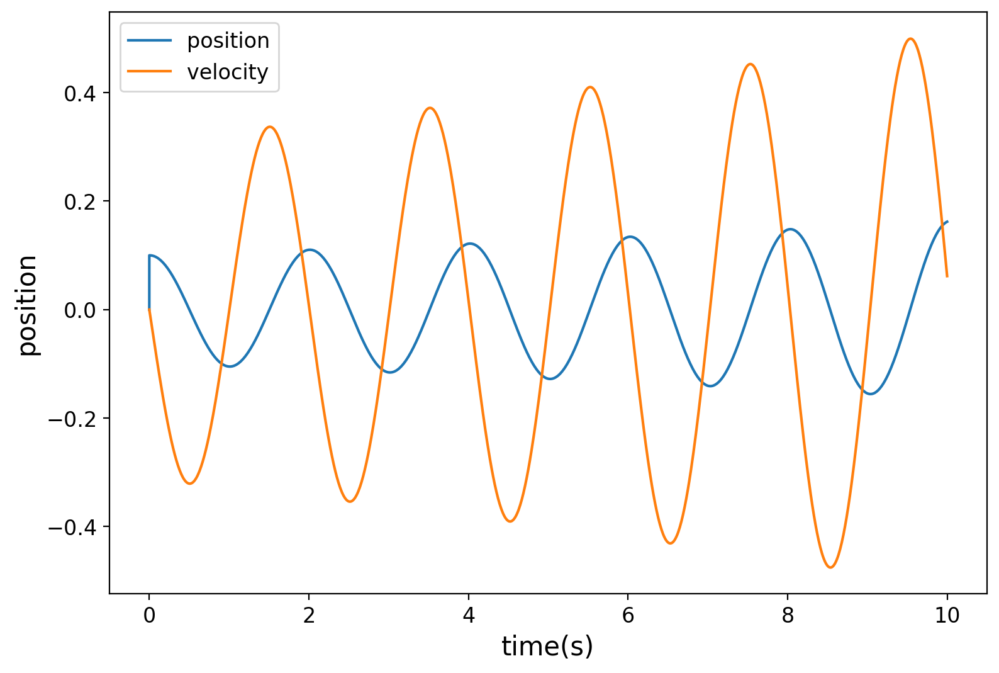

In [6]:
#>>>RUN: L17.1-runcell01

#theta[0]=x
#theta[1]=v

def step(theta,dt,g,l):
    theta_tmp  = theta[0]
    theta_vtmp = theta[1] 
    theta[0] += theta_vtmp * dt
    theta[1] += (g/l)*(-1)*theta_tmp*dt

def store(theta,thetapos,time,timepos):
    thetapos = np.vstack((thetapos,theta))
    timepos  = np.vstack((timepos,time))
    return timepos,thetapos
    
def loop(istep, nsteps=10000,dt=0.01,g=9.8,l=1):
    timepos  = np.zeros(1)
    thetapos = np.zeros((1,2));
    time     = 0
    theta    = np.zeros(2)
    theta[0] = 0.1 #initial conditions
    theta[1] = 0.0
    timepos,thetapos=store(theta,thetapos,time,timepos)
    for timestep in range(nsteps):
        istep(theta,dt,g,l)
        time += dt
        timepos,thetapos=store(theta,thetapos,time,timepos)
    return timepos,thetapos

timepos,thetapos=loop(step,nsteps=1000)

plt.plot(timepos,thetapos[:,0],label="position")
plt.plot(timepos,thetapos[:,1],label="velocity")
plt.legend()
plt.xlabel("time(s)")
plt.ylabel("position")
plt.show()


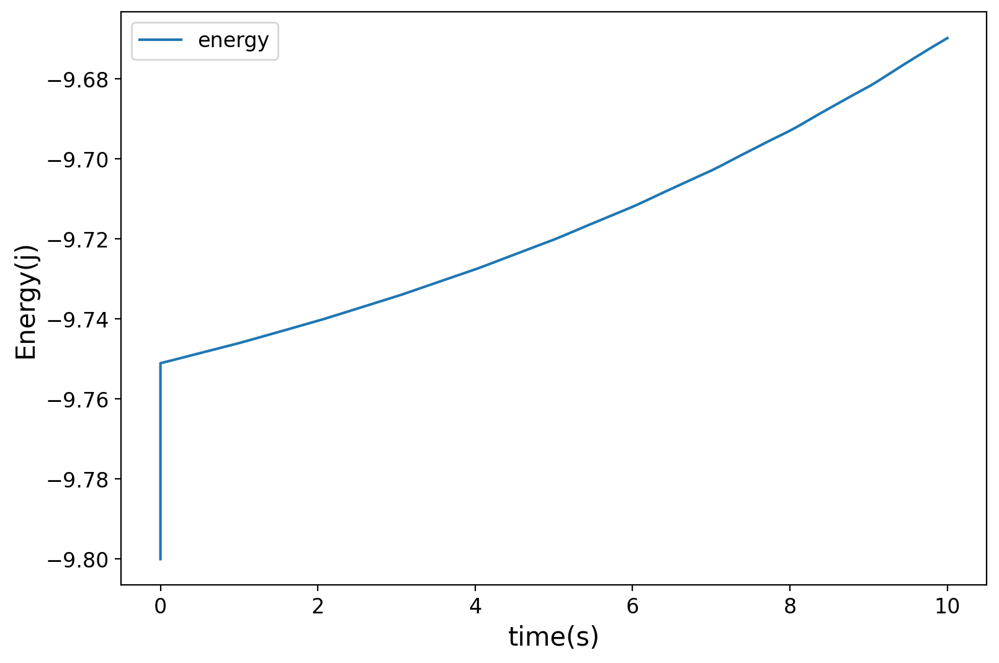

In [7]:
#>>>RUN: L17.1-runcell02

def energy(theta,g=9.8,l=1):
    kin=0.5*(l*theta[:,1])**2
    pot=-g*l*np.cos(theta[:,0])
    return kin+pot 

epos = energy(thetapos)

plt.plot(timepos,epos,label="energy")
plt.legend()
plt.xlabel("time(s)")
plt.ylabel("Energy(j)")
plt.show()

<a name='exercises_17_1'></a>     

| [Top](#section_17_0) | [Restart Section](#section_17_1) | [Next Section](#section_17_2) |


### <span style="border:3px; border-style:solid; padding: 0.15em; border-color: #90409C; color: #90409C;">Exercise 17.1.1</span>

Use the definitions for position and velocity shown below to explicitly compute the difference in energy for a step $\Delta t$. Specifically, calculate the difference in energy $\Delta \mathcal{H_{1}} = \mathcal{H_{1}}-\mathcal{H_{0}}$. Assume an initial angle of $\theta_0=0$ and a non-zero initial angular velocity $\dot{\theta}_0$.

$$
\theta_{n+1} = \theta_{n} + \Delta t \dot{\theta}_{n}\\
\dot{\theta}_{n+1} = \dot{\theta}_{n} - \Delta t \frac{g}{\ell} \theta_n \\
$$

Express your answer in terms of `m`, `g`, `l` for $\ell$, `Deltat` for $\Delta t$, and `thetadot_0` for $\dot{\theta}_0$. Make small angle approximations of any trig functions in your answer using the assumption that $\Delta t$ is very small.

### <span style="border:3px; border-style:solid; padding: 0.15em; border-color: #90409C; color: #90409C;">Exercise 17.1.2</span>

Show that the total change in energy varies with $\Delta t$ when stepping over the same total period of time. To do this, consider two different step sizes `dt1=0.001` and `dt2=0.01` and a total time of $10$. Create a plot of energy versus time for these choices of step size. Make sure that you step your simulation over the same total time: $n_{\rm steps} \times \Delta t$.

To check your code, calculate the magnitude of the fractional difference in energy between the last element of the `dt1=0.001` computation and the last energy using the `dt2=0.01` step size, i.e.,:

$$\mathrm{frac\_diff} = \left|\frac{\mathcal{H_{final}}(dt2)-\mathcal{H_{final}}(dt1)}{\mathcal{H_{final}}(dt1)}\right|$$.

Enter your answer as a number with precision `1e-3`.


frac_diff: 0.007820441664855803


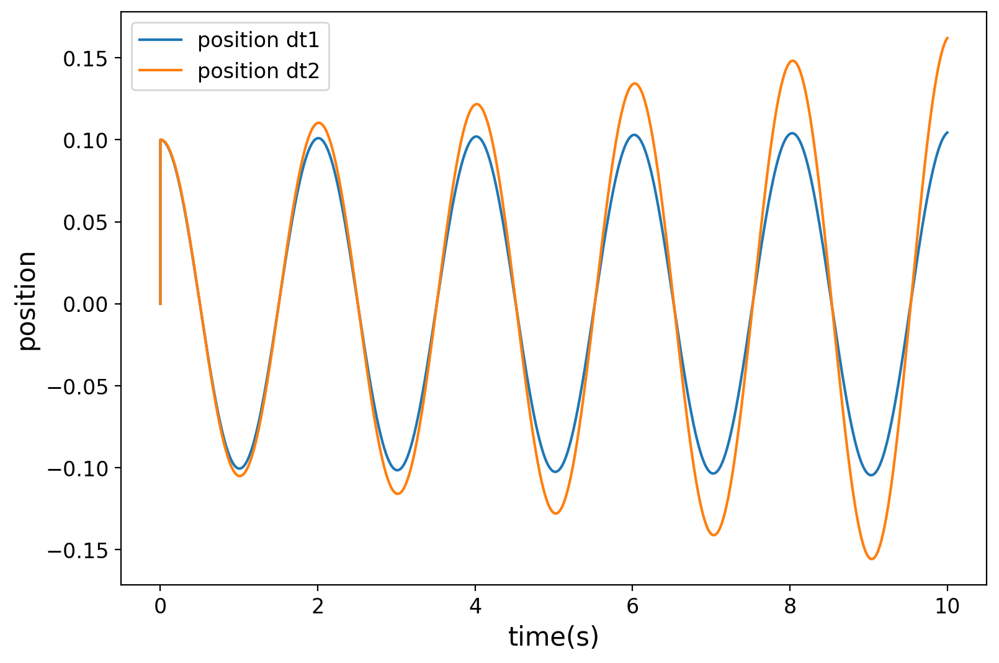

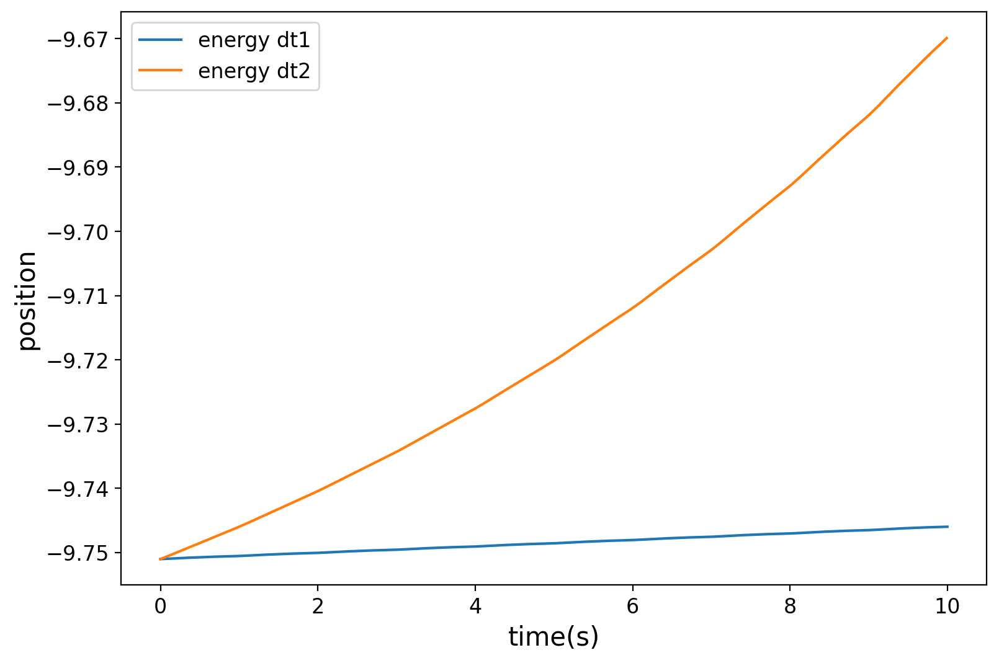

In [8]:
#>>>EXERCISE: L17.1.2

#keep time_total fixed
time_total = 10.

###################
#time-step 1:
dt1 = 0.001
nsteps1 = int(time_total/dt1)

timepos1,thetapos1=loop(step,nsteps=nsteps1,dt=dt1)
epos1 = energy(thetapos1)


###################
#time-step 2:

dt2 = 0.01
nsteps2 = int(time_total/dt2)

timepos2,thetapos2=loop(step,nsteps=nsteps2,dt=dt2)
epos2 = energy(thetapos2)


###################
#Make plots and compute
#fractional difference in energy

delta_H = epos2[-1] - epos1[-1]
print("frac_diff:", abs(delta_H/epos1[-1]))


#MAKE PLOTS
plt.plot(timepos1,thetapos1[:,0], label="position dt1")
plt.plot(timepos2,thetapos2[:,0], label="position dt2")
plt.legend()
plt.xlabel("time(s)")
plt.ylabel("position")
plt.show()

plt.plot(timepos1[1:-1], epos1[1:-1], label="energy dt1")
plt.plot(timepos2[1:-1], epos2[1:-1], label="energy dt2")
plt.legend()
plt.xlabel("time(s)")
plt.ylabel("position")
plt.show()

### <span style="border:3px; border-style:solid; padding: 0.15em; border-color: #90409C; color: #90409C;">Exercise 17.1.3</span>

Why is it important that energy is conserved in a numerical stepper?

A) Conserving energy ensures that the numerical solution accurately reflects the physical behavior of the system, providing realistic and meaningful results.

B) Energy conservation is often linked to the stability of the numerical method over long integration times, so methods that conserve energy are less likely to exhibit numerical artifacts or instability.

C) In systems with oscillatory motion, conserving energy helps maintain the correct frequency and amplitude of oscillations over time.

D) Deviations from energy conservation can lead to systematic errors in the solution.

E) Non-conservative methods may introduce unphysical damping or amplification, leading to incorrect results and potentially misleading interpretations of the system's behavior.

<a name='section_17_2'></a>
<hr style="height: 1px;">

## <h2 style="border:1px; border-style:solid; padding: 0.25em; color: #FFFFFF; background-color: #90409C">L17.2 The Symplectic Approach</h2>  

| [Top](#section_17_0) | [Previous Section](#section_17_1) | [Exercises](#exercises_17_2) | [Next Section](#section_17_3) |


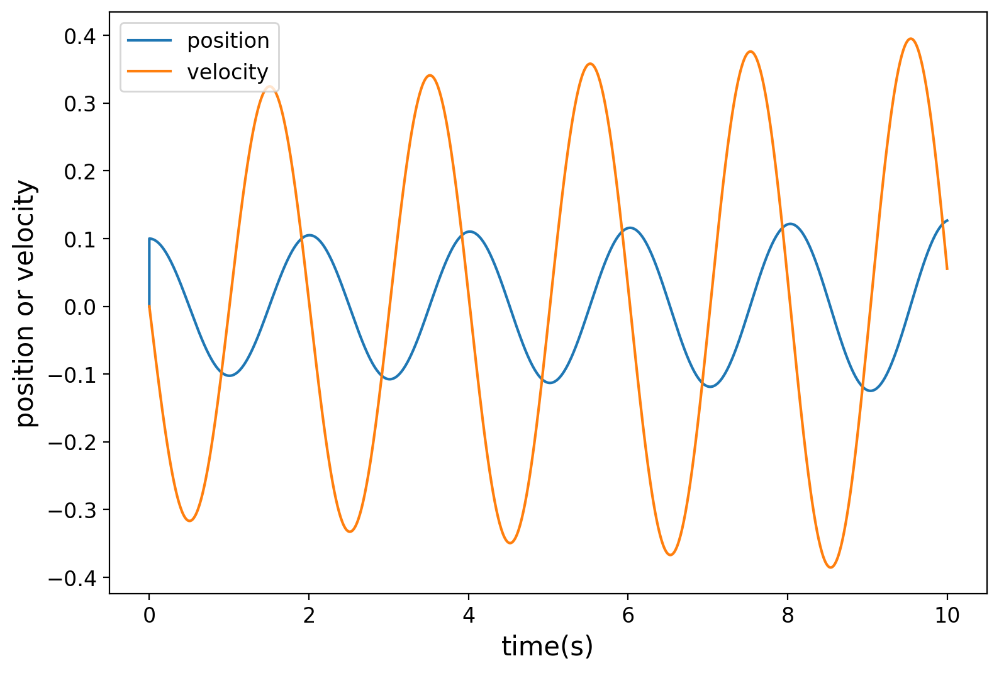

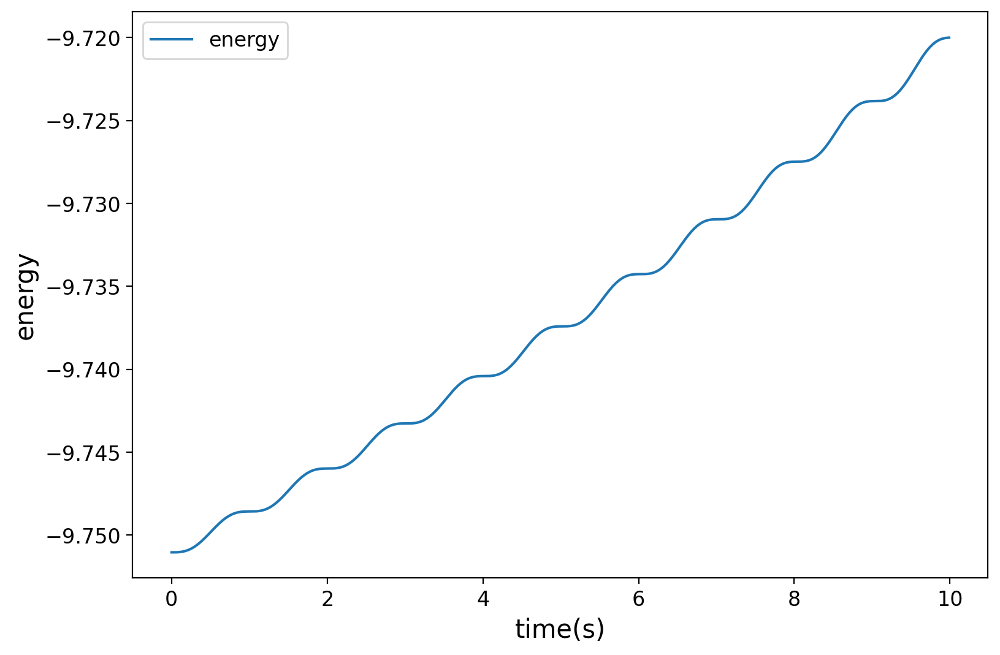

In [9]:
#>>>RUN: L17.2-runcell01

def step(theta,dt,g,l):
    theta_tmp  = theta[0]
    theta_vtmp = theta[1] 
    theta[0] += theta_vtmp * dt + 0.5*(g/l)*(-1)*np.sin(theta_tmp)*dt**2 #comment out higher-order term if desired
    theta[1] += (g/l)*(-1)*np.sin(theta_tmp)*dt
    #theta[1] += (g/l)*(-1)*theta_tmp*dt

    
def energy(theta,g=9.8,l=1):
    kin=0.5*l*l*theta[:,1]**2
    pot=-g*l*np.cos(theta[:,0])
    return kin+pot 

timepos,thetapos=loop(step,nsteps=1000,dt=0.01)

plt.plot(timepos,thetapos[:,0],label="position")
plt.plot(timepos,thetapos[:,1],label="velocity")
plt.legend()
plt.xlabel("time(s)")
plt.ylabel("position or velocity")
plt.show()

timepos,thetapos=loop(step,nsteps=1000,dt=0.01)
epos = energy(thetapos)

plt.plot(timepos[1:-1],epos[1:-1],label="energy")
plt.legend()
plt.xlabel("time(s)")
plt.ylabel("energy")
plt.show()


<a name='exercises_17_2'></a>     

| [Top](#section_17_0) | [Restart Section](#section_17_2) | [Next Section](#section_17_3) |


### <span style="border:3px; border-style:solid; padding: 0.15em; border-color: #90409C; color: #90409C;">Exercise 17.2.1</span>

Compare the energy conservation for a quadratic approximation of the Euler method vs the linear approximation, over a period of 10s. Make any relevant plots to help your analysis.

To check your result, calculate the magnitude of the fractional difference in energy between the last elements of your computation, relative to the energy computed using the quadratic approximation, i.e.,:

$$\mathrm{frac\_diff} = \left|\frac{\mathcal{H_{linear}}(10s)-\mathcal{H_{quadratic}}(10s)}{\mathcal{H_{quadratic}}(10s)}\right|$$.

Enter your answer as a number with precision `1e-3`.

frac_diff: 0.0051555928757477274


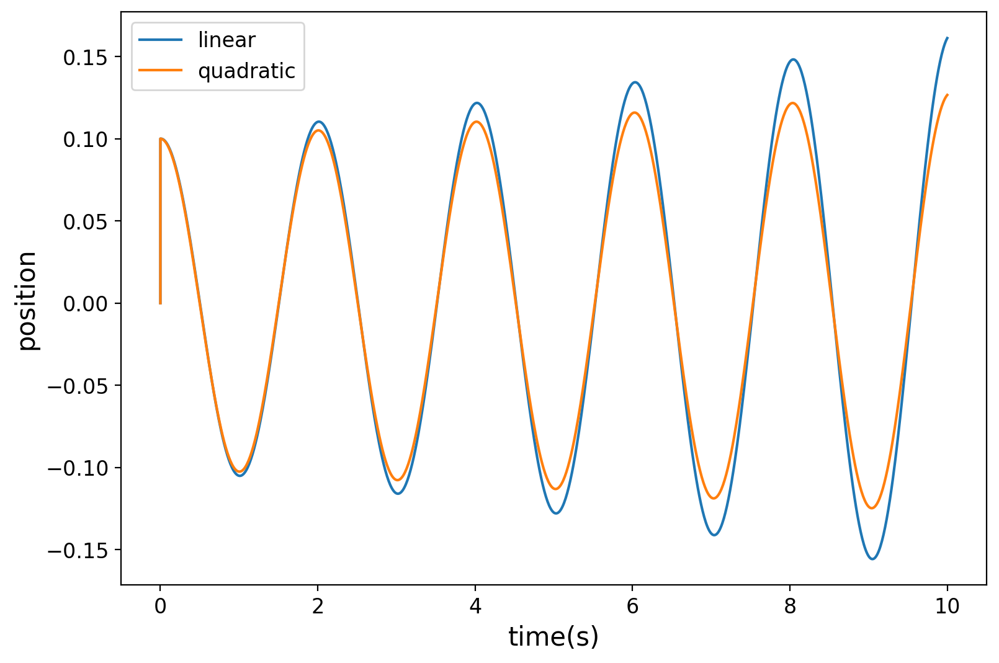

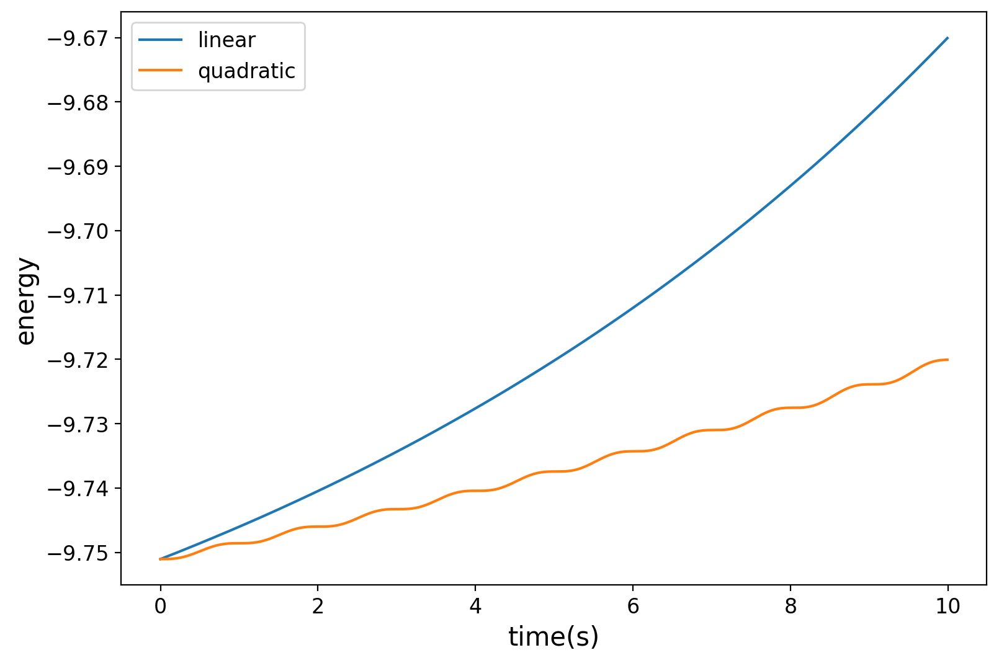

In [10]:
#>>>EXERCISE: L17.2.1

#Functions
##########

def stepl(theta,dt,g,l):
    #linear stepper
    theta_tmp  = theta[0]
    theta_vtmp = theta[1] 
    theta[0] += theta_vtmp * dt 
    theta[1] += (g/l)*(-1)*np.sin(theta_tmp)*dt
    
def stepq(theta,dt,g,l):
    #quadratic stepper
    theta_tmp = theta[0]
    theta_vtmp = theta[1]
    theta[0] += theta_vtmp * dt + 0.5 * (g/l) * (-1) * theta_tmp * dt**2
    theta[1] += (g/l)*(-1)*np.sin(theta_tmp)*dt
    


#run steps
##########

timeposl,thetaposl=loop(stepl,nsteps=1000,dt=0.01)
timeposq,thetaposq=loop(stepq,nsteps=1000,dt=0.01)
eposl = energy(thetaposl)
eposq = energy(thetaposq)
delta_H = eposl[-1] - eposq[-1]
print("frac_diff:", abs(delta_H/eposq[-1]))



###################
#Make plots and compute
#fractional difference in energy
plt.plot(timepos,thetaposl[:,0],label="linear")
plt.plot(timepos,thetaposq[:,0],label="quadratic")
plt.legend()
plt.xlabel("time(s)")
plt.ylabel("position")
plt.show()

plt.plot(timepos[1:-1],eposl[1:-1],label="linear")
plt.plot(timepos[1:-1],eposq[1:-1],label="quadratic")
plt.legend()
plt.xlabel("time(s)")
plt.ylabel("energy")
plt.show()
                           
                           



<a name='section_17_3'></a>
<hr style="height: 1px;">

## <h2 style="border:1px; border-style:solid; padding: 0.25em; color: #FFFFFF; background-color: #90409C">L17.3 The Leap-Frog Verlet Approach</h2>  

| [Top](#section_17_0) | [Previous Section](#section_17_2) | [Exercises](#exercises_17_3) | [Next Section](#section_17_4) |


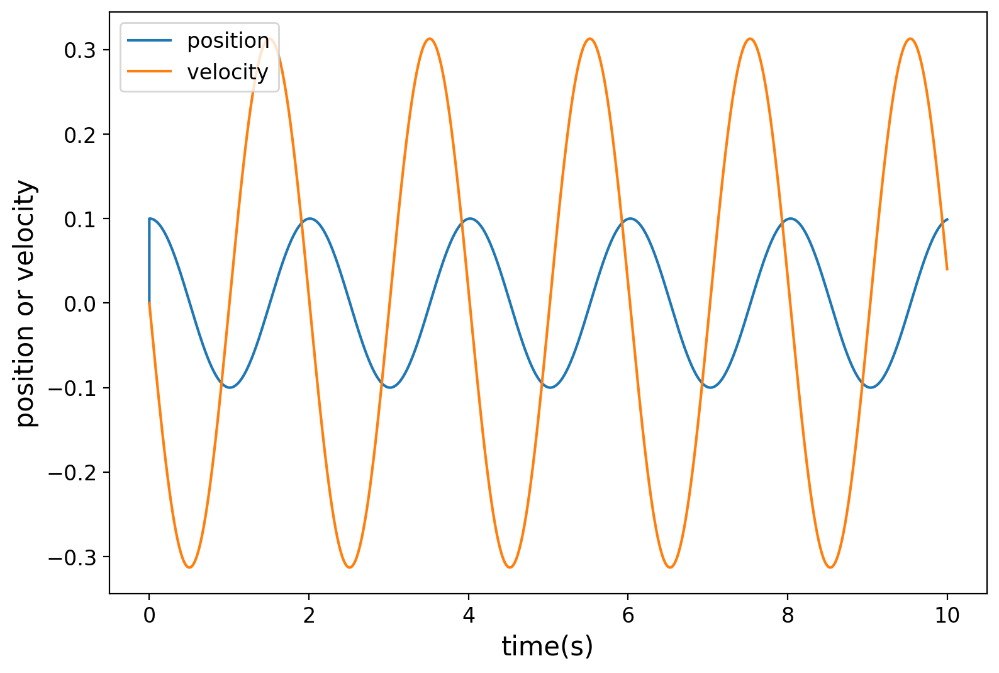

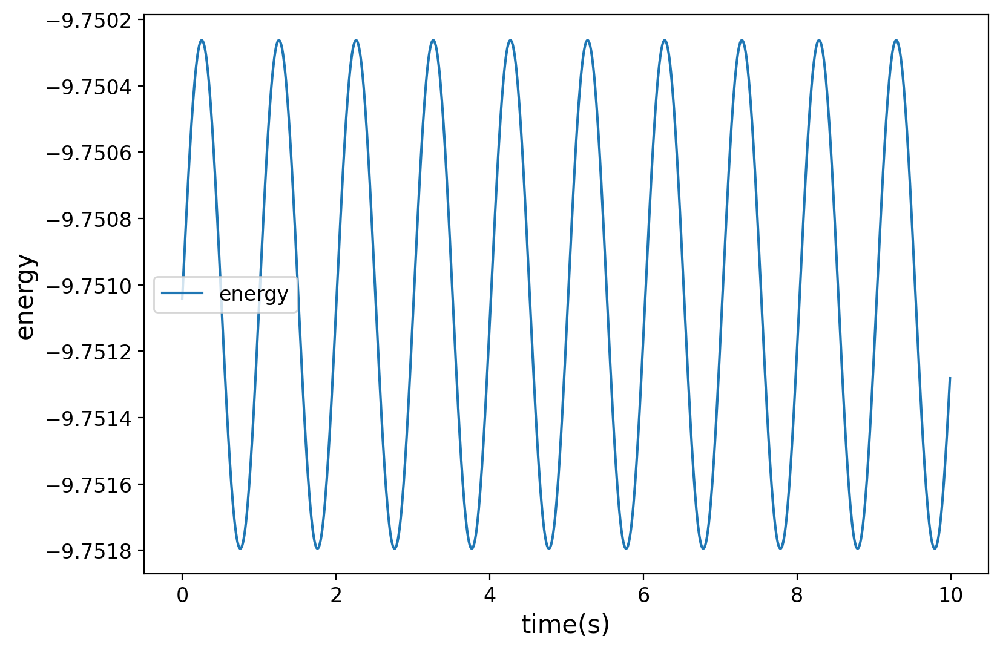

In [11]:
#>>>RUN: L17.3-runcell01


def altstep(theta,dt,g,l):
    theta[0] += theta[1] * dt 
    theta[1] += (g/l)*(-1)*np.sin(theta[0])*dt
    
def loop(istep,nsteps=1000,dt=0.01,g=9.8,l=1):
    timepos  = np.zeros(1)
    thetapos = np.zeros((1,2));
    time     = 0
    theta    = np.zeros(2)
    theta[0] = 0.1 #initial conditions
    theta[1] = 0.0
    #theta[1] += (g/l)*(-1)*theta[0]*dt*0.5 #half step
    timepos,thetapos=store(theta,thetapos,time,timepos)
    for timestep in range(nsteps):
        istep(theta,dt,g,l)
        time += dt
        timepos,thetapos=store(theta,thetapos,time,timepos)
    return timepos,thetapos


timepos,thetapos=loop(altstep,nsteps=1000,dt=0.01)
plt.plot(timepos,thetapos[:,0],label="position")
plt.plot(timepos,thetapos[:,1],label="velocity")
plt.legend()
plt.xlabel("time(s)")
plt.ylabel("position or velocity")
plt.show()

epos = energy(thetapos)

plt.plot(timepos[1:-1],epos[1:-1],label="energy")
plt.legend()
plt.xlabel("time(s)")
plt.ylabel("energy")
plt.show()


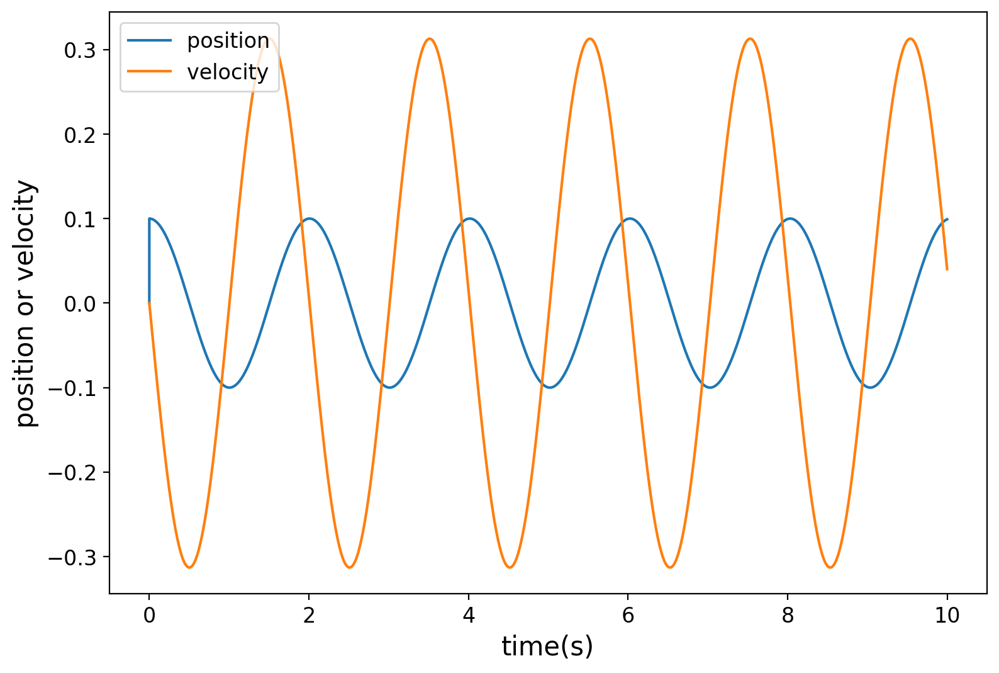

E0: -9.751040819724654 E1: -9.751041017809632


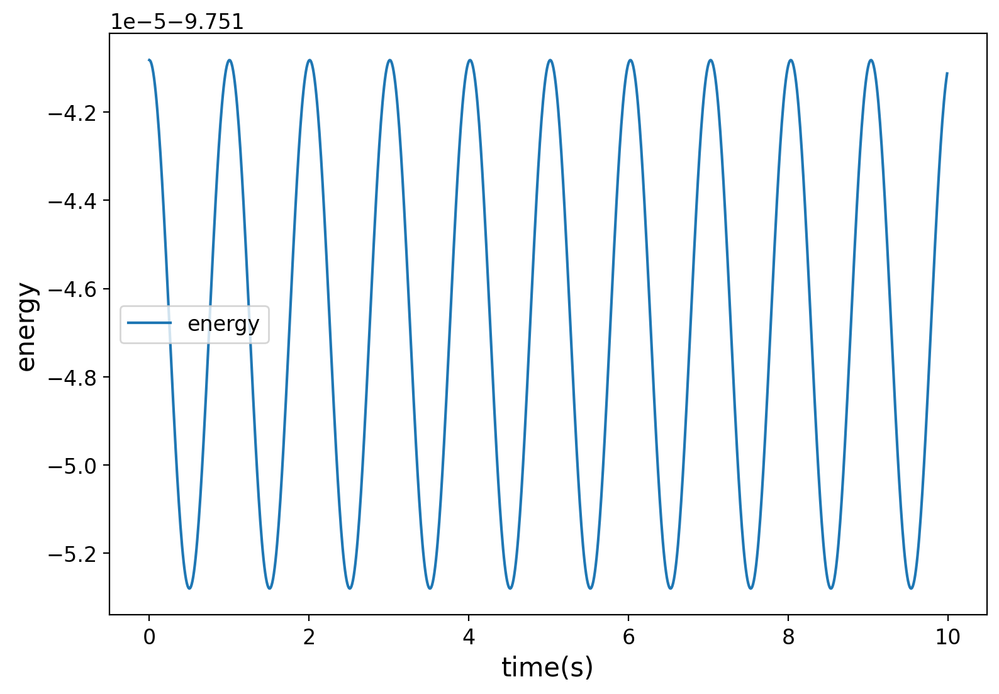

In [12]:
#>>>RUN: L17.3-runcell02

def lfstep(theta,dt,g,l):
    theta[1] += 0.5*(g/l)*(-1)*np.sin(theta[0])*dt
    theta[0] += theta[1] * dt 
    #theta[1] += (g/l)*(-1)*theta[0]*dt
    theta[1] += 0.5*(g/l)*(-1)*np.sin(theta[0])*dt
    
def loop(istep,nsteps=1000,dt=0.01,g=9.8,l=1):
    timepos  = np.zeros(1)
    thetapos = np.zeros((1,2));
    time     = 0
    theta    = np.zeros(2)
    theta[0] = 0.1 #initial conditions
    theta[1] = 0.0
    #theta[1] += (g/l)*(-1)*theta[0]*dt*0.5 #half step
    timepos,thetapos=store(theta,thetapos,time,timepos)
    for timestep in range(nsteps):
        istep(theta,dt,g,l)
        time += dt
        timepos,thetapos=store(theta,thetapos,time,timepos)
    return timepos,thetapos


timepos,thetapos=loop(lfstep,nsteps=1000,dt=0.01)
plt.plot(timepos,thetapos[:,0],label="position")
plt.plot(timepos,thetapos[:,1],label="velocity")
plt.legend()
plt.xlabel("time(s)")
plt.ylabel("position or velocity")
plt.show()

epos = energy(thetapos)
print("E0:",epos[1],"E1:",epos[-1])

plt.plot(timepos[1:-1],epos[1:-1],label="energy")
plt.legend()
plt.xlabel("time(s)")
plt.ylabel("energy")
plt.show()


<a name='exercises_17_3'></a>     

| [Top](#section_17_0) | [Restart Section](#section_17_3) | [Next Section](#section_17_4) |


### <span style="border:3px; border-style:solid; padding: 0.15em; border-color: #90409C; color: #90409C;">Exercise 17.3.1</span>

Take a closer look at the position, velocity, and energy distributions above. How does the frequency of the energy variation compare to the natural oscillation frequency of the system? Where does this variation come from?

The frequency of energy oscillation is

A) equal to the natural frequency of oscillation of the system.\
B) half the natural frequency of oscillation of the system.\
C) double the natural frequency of oscillation of the system.


### <span style="border:3px; border-style:solid; padding: 0.15em; border-color: #90409C; color: #90409C;">Exercise 17.3.2</span>

How is energy conserved in the Leap-Frog Verlet procedure? Choose the most appropriate option:

A) The procedure adjusts energy explicitly at each time step to ensure conservation.

B) Energy conservation is achieved through random position updates.

C) Energy conservation results from staggered position and velocity updates.

D) The procedure continuously corrects velocity to maintain consistent energy conservation.



<a name='section_17_4'></a>
<hr style="height: 1px;">

## <h2 style="border:1px; border-style:solid; padding: 0.25em; color: #FFFFFF; background-color: #90409C">L17.4 Runge-Kutta</h2>  

| [Top](#section_17_0) | [Previous Section](#section_17_3) | [Exercises](#exercises_17_4) | [Next Section](#section_17_5) |


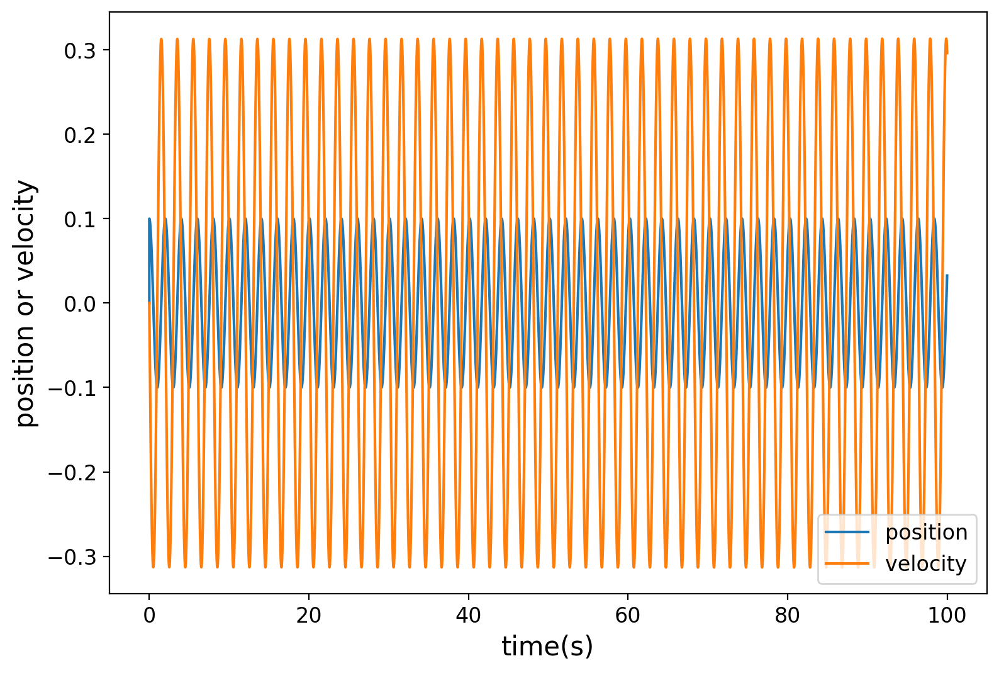

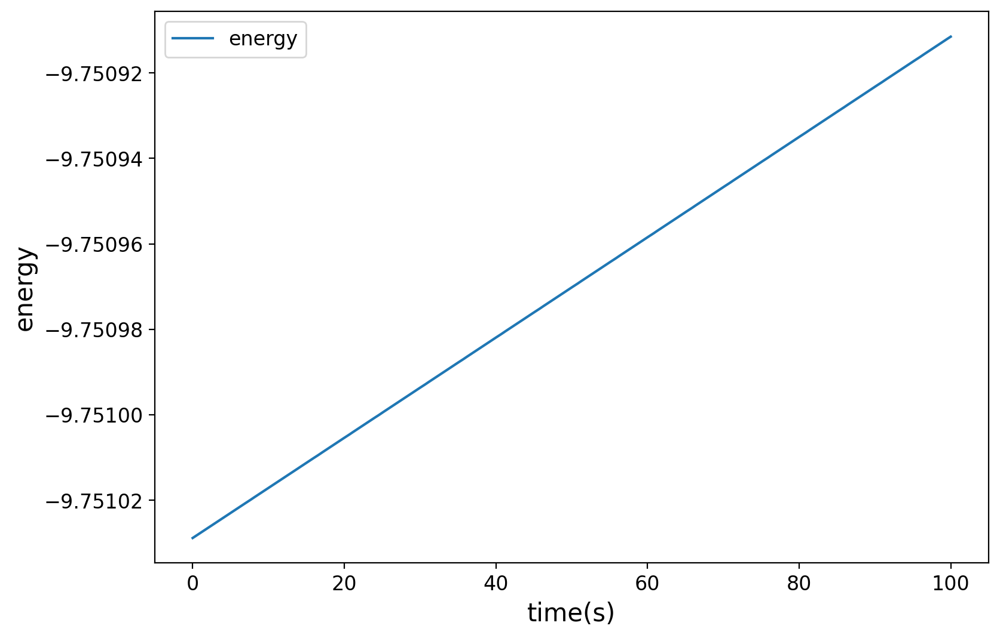

In [13]:
#>>>RUN: L17.4-runcell01

def thetaa(itheta,g,l):
    return -(g/l)*np.sin(itheta)   

def thetav(ithetad):
    return ithetad# - (g/l)*np.sin(itheta)*idt

def rkstep(theta,dt,g,l):
    thetan    = theta[0]
    thetavn   = theta[1]
    thetaan   = thetaa(thetan,g,l)
    #theta[0] += dt*0.5*(thetavn+thetav(thetavn,dt*0.5,thetan,g,l))#current + extrapolated 
    #theta[1] += dt*0.5*(thetaa(theta[0],0,0,g,l) + thetaa(theta[0],dt,thetavn,g,l))
    theta[0] += 0.5*dt*(thetavn + thetav(thetavn+dt*thetaa(thetan,g,l)    ))
    theta[1] += 0.5*dt*(thetaan + thetaa(thetan +dt*thetav(thetavn   ),g,l))

def loop(nsteps=100000,dt=0.01,g=9.8,l=1):
    timepos  = np.zeros(1)
    thetapos = np.zeros((1,2));
    time     = 0
    theta    = np.zeros(2)
    theta[0] = 0.1 #initial conditions
    theta[1] = 0.0
    theta[1] += dt*0.5*(thetaa(theta[0],g,l))
    timepos,thetapos=store(theta,thetapos,time,timepos)
    for timestep in range(nsteps):
        rkstep(theta,dt,g,l)
        time += dt
        timepos,thetapos=store(theta,thetapos,time,timepos)
    return timepos,thetapos


timepos,thetapos=loop(nsteps=10000,dt=0.01)

plt.plot(timepos,thetapos[:,0],label="position")
plt.plot(timepos,thetapos[:,1],label="velocity")
plt.legend()
plt.xlabel("time(s)")
plt.ylabel("position or velocity")
plt.show()

epos = energy(thetapos)

plt.plot(timepos[1:-1],epos[1:-1],label="energy")
plt.legend()
plt.xlabel("time(s)")
plt.ylabel("energy")
plt.show()



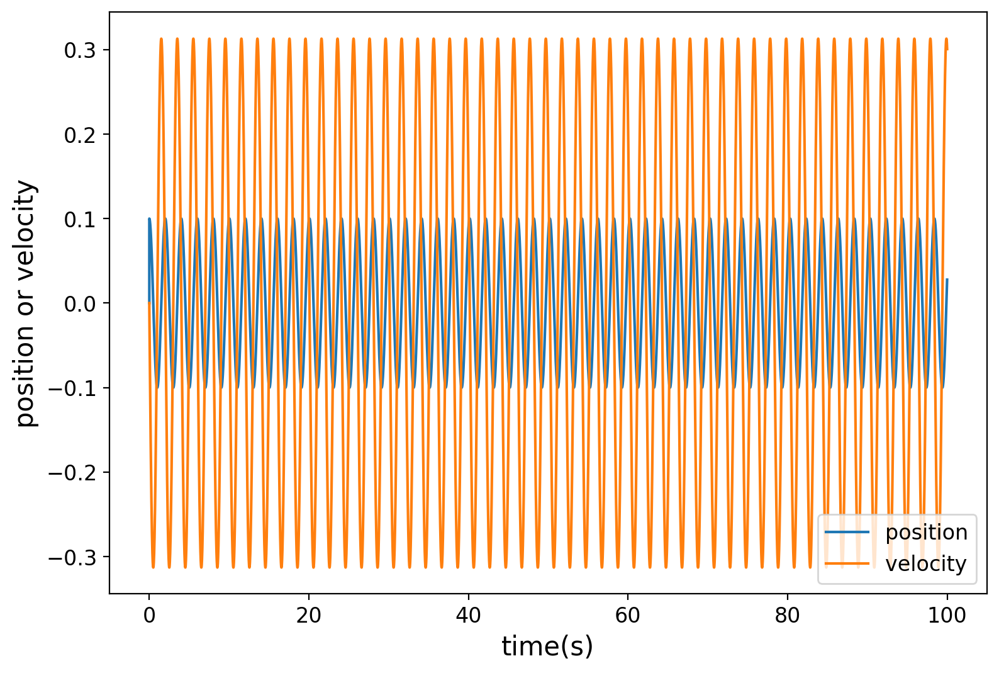

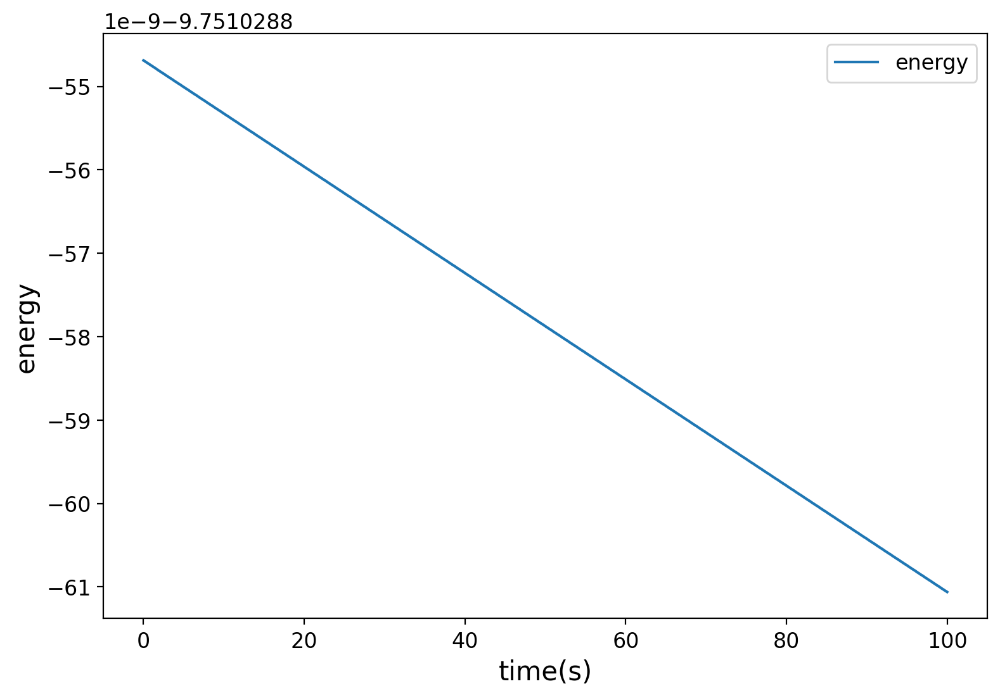

E-start: -9.751028854688004 E-end -9.751028861062562


In [14]:
#>>>RUN: L17.4-runcell02


def rkstep(theta,dt,g,l):
    thetan     = theta[0]
    thetavn    = theta[1]
    thetaan    = thetaa(thetan,g,l)    
    #half step
    thetavn05  = thetav(thetavn  +0.5*dt*thetaan) 
    thetaan05  = thetaa(thetan   +0.5*dt*thetavn,g,l) 
    #half step based on previous half
    thetavn05d = thetav(thetavn  +0.5*dt*thetaan05)    
    thetaan05d = thetaa(thetan   +0.5*dt*thetavn05,g,l)
    #full step based on previous half
    thetavn10  = thetav(thetavn  +1.0*dt*thetaan05d)
    thetaan10  = thetaa(thetan   +1.0*dt*thetavn05d,g,l)
    #runge-Kutta did the math for us
    theta[0] += (1./6.)*dt*(thetavn + 2*thetavn05  + 2*thetavn05d + thetavn10)
    theta[1] += (1./6.)*dt*(thetaan + 2*thetaan05  + 2*thetaan05d + thetaan10)

timepos,thetapos=loop(nsteps=10000,dt=0.01)

plt.plot(timepos,thetapos[:,0],label="position")
plt.plot(timepos,thetapos[:,1],label="velocity")
plt.legend()
plt.xlabel("time(s)")
plt.ylabel("position or velocity")
plt.show()

epos = energy(thetapos)

plt.plot(timepos[1:-1],epos[1:-1],label="energy")
plt.legend()
plt.xlabel("time(s)")
plt.ylabel("energy")
plt.show()

print("E-start:",epos[1],"E-end",epos[-1])

<a name='exercises_17_4'></a>     

| [Top](#section_17_0) | [Restart Section](#section_17_4) | [Next Section](#section_17_5) |


### <span style="border:3px; border-style:solid; padding: 0.15em; border-color: #90409C; color: #90409C;">Exercise 17.4.1</span>

Let's now look at the pendulum in the non-linear regime, namely larger angles where the approximation $\sin(\theta)\approx\theta$ no longer holds. Compare the Runge-Kutta method to the leap-frog method for an initial angle $\theta_0=0.9$ radians. How does the conservation of energy for each method compare, using a fixed time-step of `dt=0.01`?

To answer this question, complete the code below to create your desired plots (the functions `rkloop` and `lfloop` are already defined for you, corresponding to the Runge-Kutta and leap-frog methods, respectively).

Select ALL that apply:


A) Both the RK and LF methods show comparable changes in energy over time.\
B) The RK method shows larger variations in energy over time than the LF method.\
C) The RK method shows smaller variations in energy over time than the LF method.\
D) The average energy using the RK method appears to decrease over time, whereas that for the LF method does not.\
E) The average energy using the LF method appears to decrease over time, whereas that for the RK method does not.



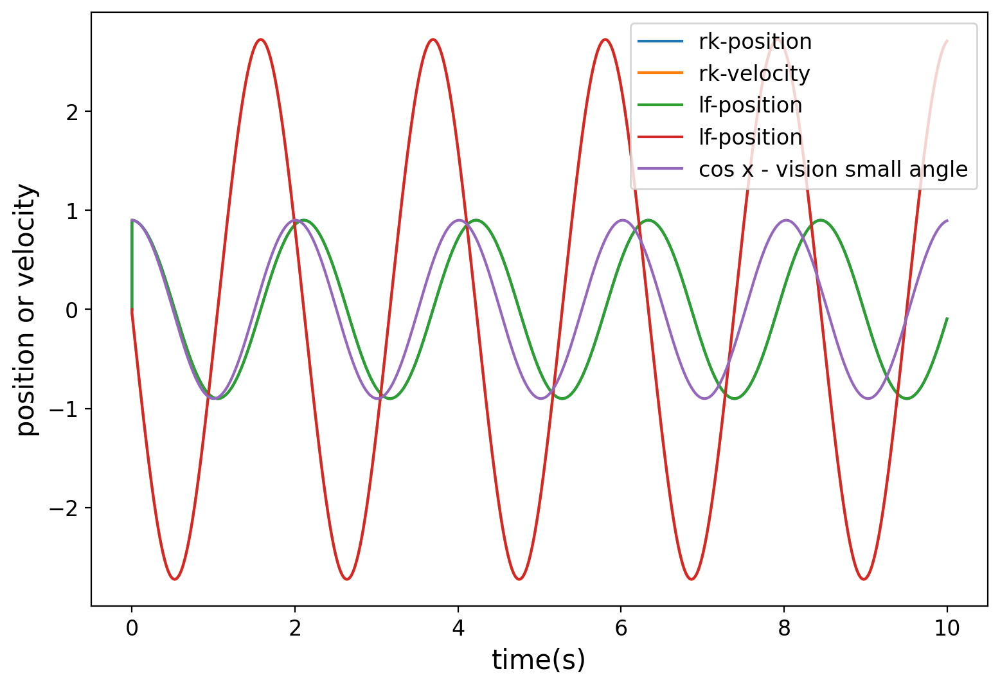

ValueError: x and y must have same first dimension, but have shapes (1002, 1) and (1,)

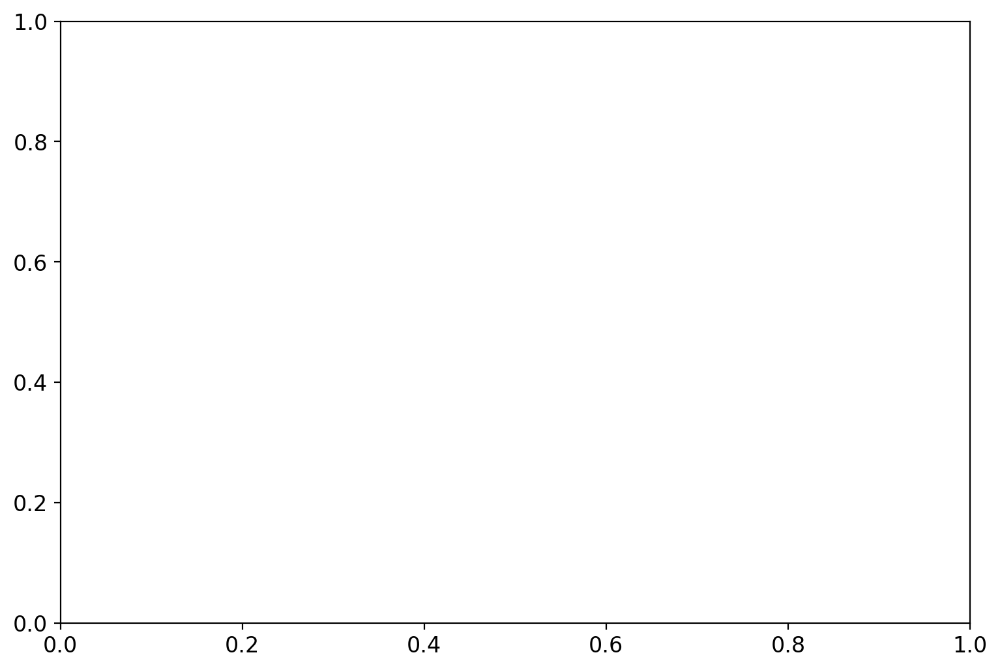

In [15]:
#>>>EXERCISE: L17.4.1

thetainit=0.9 #units of radians
def rkloop(total_time=10,dt=0.01,g=9.8,l=1):
    nsteps = int(total_time/dt)
    timepos  = np.zeros(1)
    thetapos = np.zeros((1,2));
    time     = 0
    theta    = np.zeros(2)
    theta[0] = thetainit #initial conditions
    theta[1] = 0.0
    theta[1] += dt*0.5*(thetaa(theta[0],g,l))
    timepos,thetapos=store(theta,thetapos,time,timepos)
    for timestep in range(nsteps):
        rkstep(theta,dt,g,l)
        time += dt
        timepos,thetapos=store(theta,thetapos,time,timepos)
    return timepos,thetapos

def lfloop(total_time=10,dt=0.01,g=9.8,l=1):
    nsteps = int(total_time/dt)
    timepos  = np.zeros(1)
    thetapos = np.zeros((1,2));
    time     = 0
    theta    = np.zeros(2)
    theta[0] = thetainit #initial conditions
    theta[1] = 0.0
    theta[1] += dt*0.5*(thetaa(theta[0],g,l))
    timepos,thetapos=store(theta,thetapos,time,timepos)
    for timestep in range(nsteps):
        lfstep(theta,dt,g,l)
        time += dt
        timepos,thetapos=store(theta,thetapos,time,timepos)
    return timepos,thetapos



#PLOT COMPARISONS HERE
rktimepos, rkthetapos=rkloop(total_time=10, dt=0.01)
lftimepos, lfthetapos=lfloop(total_time=10, dt=0.01)

plt.plot(rktimepos, rkthetapos[:,0], label="rk-position")
plt.plot(rktimepos, rkthetapos[:,1], label="rk-velocity")
plt.plot(lftimepos, lfthetapos[:,0], label="lf-position")
plt.plot(lftimepos, lfthetapos[:,1], label="lf-position")

plt.plot (lftimepos, thetainit*np.cos(np.sqrt(9.8)*lftimepos),label="cos x - vision small angle")
plt.legend()
plt.xlabel("time(s)")
plt.ylabel("position or velocity")
plt.show()

plt.plot(rktimepos, rkthetapos[1,-1], label="rk-energy")
plt.plot(lftimepos, lfthetapos[1,-1], label="lf-energy")

plt.legend()
plt.xlabel("time(s)")
plt.ylabel("position or velocity")
plt.show()


print("E-start: ",epos[1], "E-End", epos[-1])

### <span style="border:3px; border-style:solid; padding: 0.15em; border-color: #90409C; color: #90409C;">Exercise 17.4.2</span>

Now change the timestep to `dt=0.2` in the code that you wrote for the previous problem. How do the results compare? Select ALL that apply:


A) Both the RK and LF methods show comparable changes in energy over time.\
B) The RK method shows larger variations in energy over time than the LF method.\
C) The RK method shows smaller variations in energy over time than the LF method.\
D) The average energy using the RK method appears to decrease over time, whereas that for the LK method does not.\
E) The average energy using the LF method appears to decrease over time, whereas that for the RK method does not.


### <span style="border:3px; border-style:solid; padding: 0.15em; border-color: #90409C; color: #90409C;">Exercise 17.4.3</span>

How do the Runge-Kutta Algorithm and Leap-Frog Verlet procedures differ? Select ALL that apply:

A) Runge-Kutta methods generally achieve a higher order of accuracy compared to the Leap-Frog Verlet procedure.

B) The Leap-Frog Verlet procedure is a symplectic integrator, which conserves energy, while Runge-Kutta methods are not inherently symplectic.

C) The Leap-Frog Verlet procedure updates position and velocity at different points in time, leading to a staggered structure, whereas Runge-Kutta methods use weighted averages of multiple function evaluations at each time step.

<a name='section_17_5'></a>
<hr style="height: 1px;">

## <h2 style="border:1px; border-style:solid; padding: 0.25em; color: #FFFFFF; background-color: #90409C">L17.5 Modern High Quality Integrators</h2>  

| [Top](#section_17_0) | [Previous Section](#section_17_4) | [Exercises](#exercises_17_5) | [Next Section](#section_17_6) |


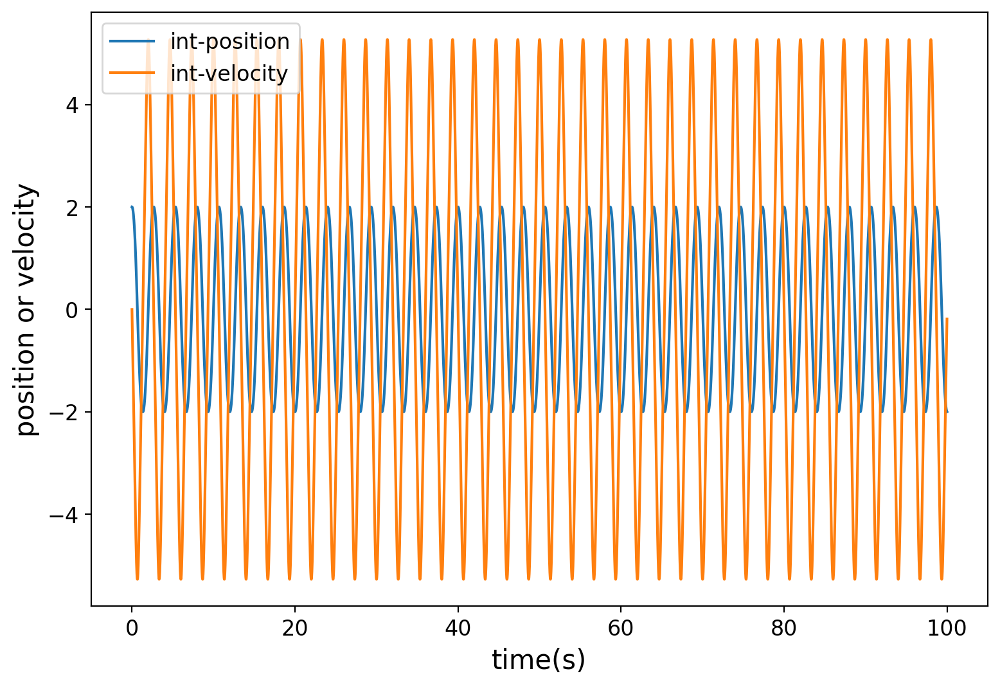

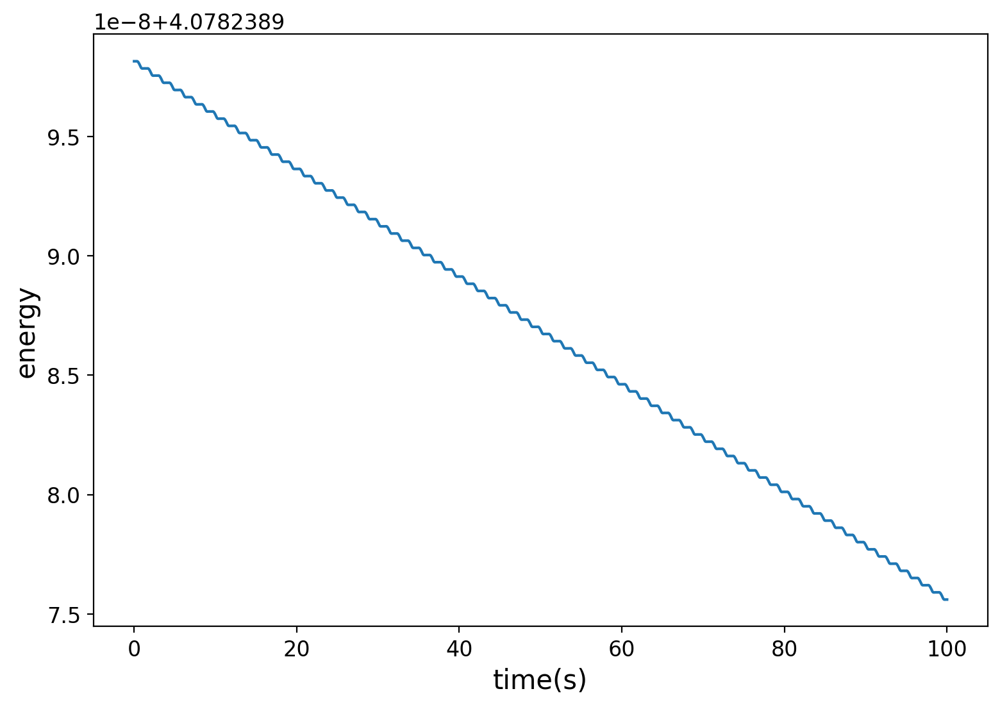

E-start: 4.078238998161996 E-end: 4.078238975598718


In [16]:
#>>>RUN: L17.5-runcell01

def df(t, thetavec, g, l):
    theta, thetadot = thetavec
    return [thetadot, -(g/l) * np.sin(theta)]

g=9.8
l=1
thetainit=2.0
solution = solve_ivp(df, [0., 10000*0.01], [thetainit, 0.], max_step = 0.01, args=(g,l))


plt.plot(solution.t, solution.y[0],label="int-position")
plt.plot(solution.t, solution.y[1],label="int-velocity")
plt.xlabel("time(s)")
plt.ylabel("position or velocity")
plt.legend()
plt.show()

#redefining energy
def energy(theta,g=9.8,l=1):
    kin=0.5*l*l*theta[:,1]**2
    pot=-g*l*np.cos(theta[:,0])
    return kin+pot 

energypos=energy(solution.y.T)
#e = 0.5 * m * solution.y[1]**2 + 0.5 * k * solution.y[0]**2
plt.plot(solution.t, energypos)
plt.xlabel("time(s)")
plt.ylabel("energy")
plt.show()

print("E-start:",energypos[1],"E-end:",energypos[-1])


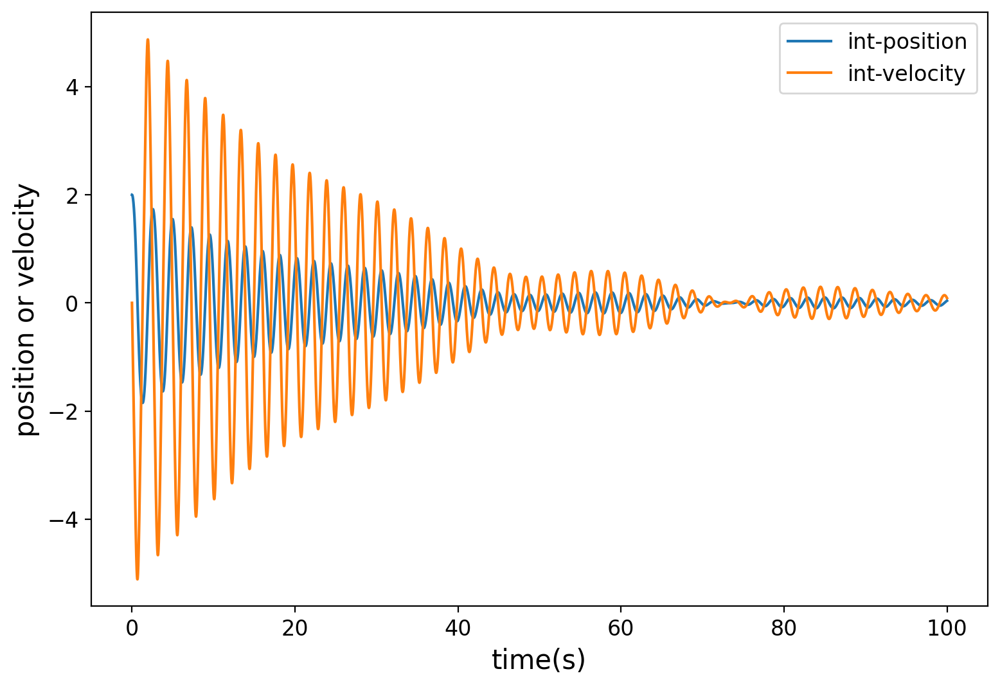

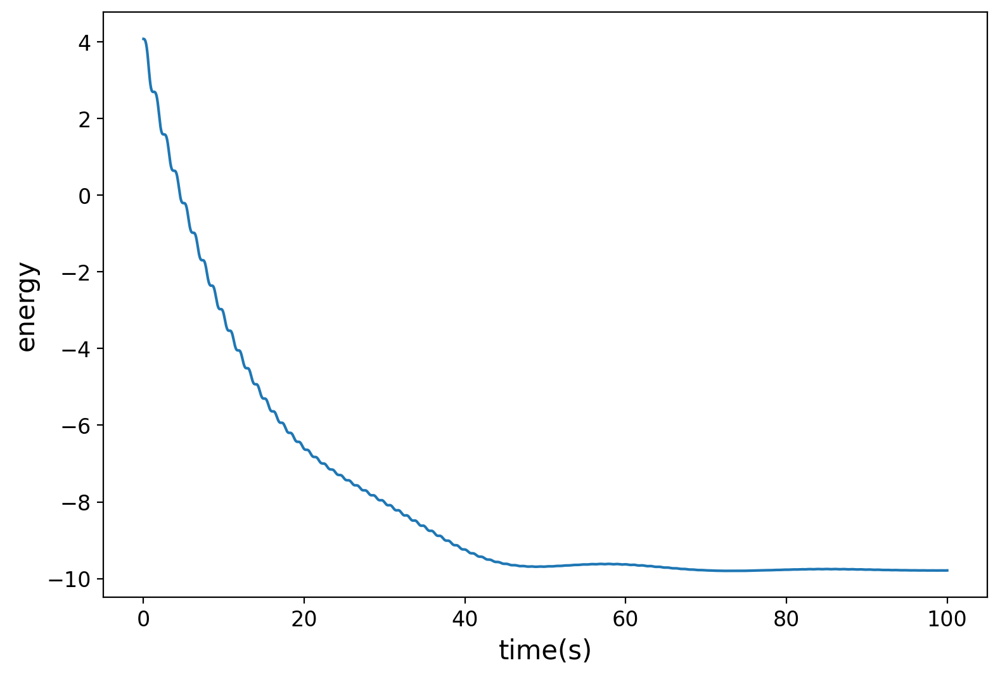

E-start: 4.07823899248926 E-end: -9.787953005826653


In [17]:
#>>>RUN: L17.5-runcell02

def df(t, thetavec, g, l, mup, fp, omega):
    theta, thetadot = thetavec
    return [thetadot, -(g/l) * np.sin(theta) - mup*thetadot + fp*np.cos(omega*t) ]

g=9.8
l=1
thetainit=2.0
mup=0.1
fp=0.1
# The following line sets the driving frequency as a fraction of the natural
# frequency of the system (g/l).
omega=np.sqrt(0.85*g/l)
solution = solve_ivp(df, [0., 10000*0.01], [thetainit, 0.], max_step = 0.01, args=(g,l,mup,fp,omega))

plt.plot(solution.t, solution.y[0],label="int-position")
plt.plot(solution.t, solution.y[1],label="int-velocity")
plt.xlabel("time(s)")
plt.ylabel("position or velocity")
plt.legend()
plt.show()

energypos=energy(solution.y.T)
#e = 0.5 * m * solution.y[1]**2 + 0.5 * k * solution.y[0]**2
plt.plot(solution.t, energypos)
plt.xlabel("time(s)")
plt.ylabel("energy")
plt.show()

print("E-start:",energypos[1],"E-end:",energypos[-1])


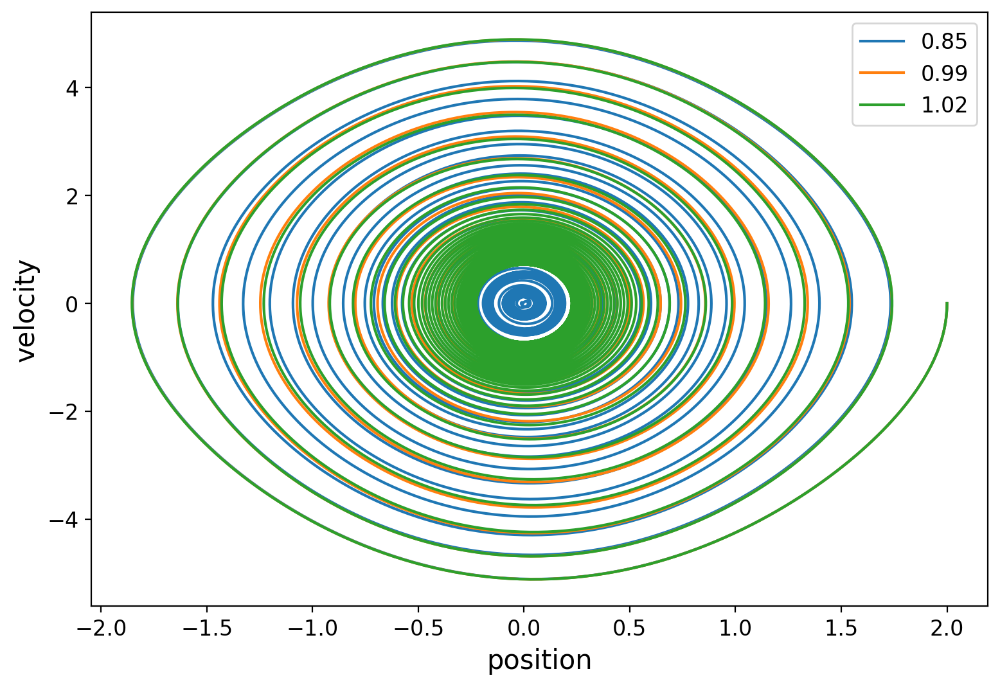

In [18]:
#>>>RUN: L17.5-runcell03


thetainit=2.0
mu=0.1
fp=0.1
l=1

omega=np.sqrt(0.99*g/l)
solution1 = solve_ivp(df, [0., 10000*0.01], [thetainit, 0.], max_step = 0.01, args=(g,l,mu,fp,omega))

omega=np.sqrt(1.02*g/l)
solution2 = solve_ivp(df, [0., 10000*0.01], [thetainit, 0.], max_step = 0.01, args=(g,l,mu,fp,omega))

plt.plot(solution.y[0], solution.y[1],label="0.85")
plt.plot(solution1.y[0], solution1.y[1],label="0.99")
plt.plot(solution2.y[0], solution2.y[1],label="1.02")
plt.xlabel("position")
plt.ylabel("velocity")
plt.legend()
plt.show()


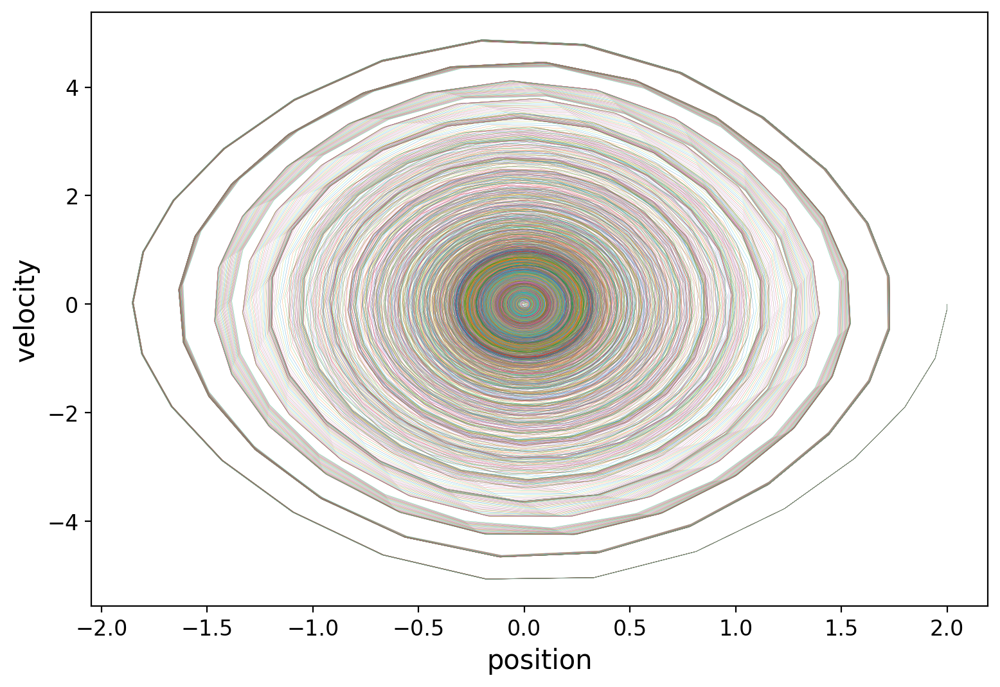

In [19]:
#>>>RUN: L17.5-runcell04

for scale in np.arange(0.8,1.20,0.01):
    omega=np.sqrt(scale*g/l)
    solution = solve_ivp(df, [0., 10000*0.01], [thetainit, 0.], max_step = 0.1, args=(g,l,mu,fp,omega))
    plt.plot(solution.y[0], solution.y[1],linewidth=0.1)


plt.xlabel("position")
plt.ylabel("velocity")
plt.show()

<a name='exercises_17_5'></a>     

| [Top](#section_17_0) | [Restart Section](#section_17_5) | [Next Section](#section_17_6) |


### <span style="border:3px; border-style:solid; padding: 0.15em; border-color: #90409C; color: #90409C;">Exercise 17.5.1</span>

In the limit of small oscillations, there is analytic solution for a damped-driven harmonic oscillator, and it has two terms, corresponding to steady-state and transient solutions, respectively. The point of this problem will be to see how well this exact solution compares to the numerical solution in the limit of small initial angle and small driving force.

$$
\theta_{\mathrm{total}} = \theta_{\mathrm{transient}} + \theta_{\mathrm{steady-state}}
$$

Firstly, the <b>steady-state solution</b> is largely governed by the driving frequency $\Omega$, and it is given by:

$$
\theta_{\mathrm{steady-state}} = A \cos(\Omega t - \phi)
$$

where the amplitude and phase are defined as:

$$
A = \frac{f'}{\sqrt{(\omega_0^2 - \Omega^2)^2 + (\mu' \Omega)^2}}
$$

$$
\phi = \arctan\left(\frac{\mu' \Omega}{\omega_0^2 - \Omega^2}\right)
$$

with the natural frequency $\omega_0 = \sqrt{\frac{g}{\ell}}$.


Next, the <b>transient solution</b> decays as a function of the damping, as follows (for the underdamped regime):

$$
\theta_{\mathrm{transient}} = e^{-\frac{\mu'}{2}t}\left(C\cos(\omega_t t) + D\cos(\omega_t t)\right)
$$

where the frequency of transient oscillations is:

$$
\omega_t = \sqrt{\omega_0^2 - \left(\frac{\mu'}{2}\right)^2}
$$


and $C$ and $D$ are determined by initial conditions. For the generalized case of initial angular position $\theta(t=0)=\theta_0$ and initial angular velocity $\dot{\theta}(t=0)=\dot{\theta}_0$:

$$
C = \theta_0 - A\cos(\Omega t)
$$

$$
D = \frac{1}{\omega_t}\left(\dot{\theta}_0 + \frac{\mu'}{2}C - \Omega A\sin(\Omega t) \right)
$$


Plot this analytic solution alongside the numerical solution (to make it simpler for viewing, you could look at the last `1000` pts of the simulation). What is the fractional difference in amplitude between the two solutions, relative to the theoretical amplitude $A$, evaluated at the very last time step (i.e., the last element of the array)? In other words, compute the following and report your answer with precision `1e-4`:

$$
\mathrm{frac\_diff} = \left|\dfrac{\theta_{numerical} - \theta_{analytic}}{A}\right|
$$


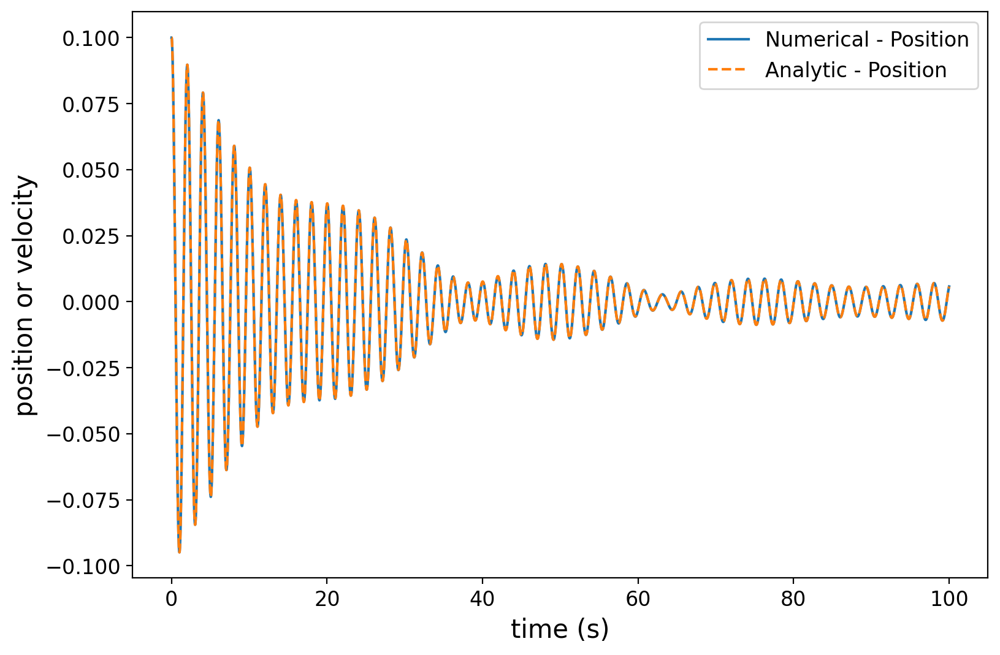

Diff Position: 0.0016327032219945387


In [20]:
#>>>EXERCISE: L17.5.1

def df(t, thetavec, g, l, mup, fp, omega):
    theta, thetadot = thetavec
    return [thetadot, -(g/l) * np.sin(theta) - mup*thetadot + fp*np.cos(omega*t)]

# Constants
g = 9.8
l = 1.
thetainit = 0.1
thetadotinit = 0.
mup = 0.1
fp = 0.01
omega = np.sqrt(0.85 * g / l)

# Solve the differential equation numerically
solution = solve_ivp(df, [0., 10000*0.01], [thetainit, thetadotinit], max_step=0.01, args=(g, l, mup, fp, omega))

# Analytic solution
omega_0 = np.sqrt(g/l)
omega_t = np.sqrt(omega_0**2 - (mup/2.)**2)
A = fp / np.sqrt((omega_0**2  - omega**2)**2 + (mup*omega)**2)
phi = np.arctan2 (mup*omega, omega_0**2 - omega**2)

t_analytic = solution.t

C = (thetainit - A* np.cos(phi))
D = (thetadotinit + (mup/2.)*C - omega * A * np.sin(phi) )/omega_t

theta_transient = np.exp(-mup*t_analytic/2.) * (C * np.cos (omega_t * t_analytic) + D * np.sin(omega_t*t_analytic))

theta_steady_state = A * np.cos(omega * t_analytic - phi)

theta_analytic = theta_transient + theta_steady_state


# Plot the numerical and analytic solutions
plt.plot (solution.t, solution.y[0], label="Numerical - Position")
plt.plot (t_analytic, theta_analytic, label="Analytic - Position", linestyle = 'dashed')

plt.xlabel("time (s)")
plt.ylabel("position or velocity")
plt.legend()
plt.show()



# Print the fractional difference
print("Diff Position:", np.abs((solution.y[0][-1] - theta_analytic[-1])/A))

### <span style="border:3px; border-style:solid; padding: 0.15em; border-color: #90409C; color: #90409C;">Exercise 17.5.2</span>

The analytic solution described above is only valid in the limit of small oscillations. Test the accuracy of the analytic solution by varying the magnitude of the driving force $f'$. Approximately what is the minimal value of $f'$ that leads to a $1\%$ difference in the angular amplitudes of the two solutions, relative to the theoretical amplitude $A$, evaluated at the very last time step (keeping all other parameters fixed). Report your answer with precision `1e-2`.

Hint: You can view the solution to the previous problem if you need help formulating an answer.

<a name='section_17_6'></a>
<hr style="height: 1px;">

## <h2 style="border:1px; border-style:solid; padding: 0.25em; color: #FFFFFF; background-color: #90409C">L17.6 Fitting the Full Thing</h2>  

| [Top](#section_17_0) | [Previous Section](#section_17_5) | [Exercises](#exercises_17_6) |

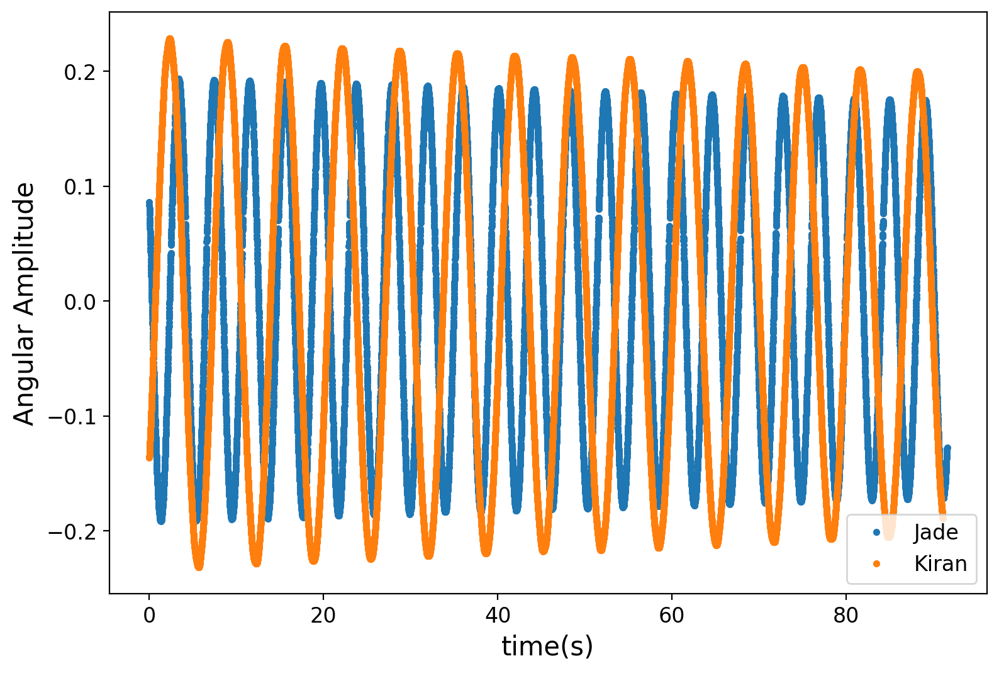

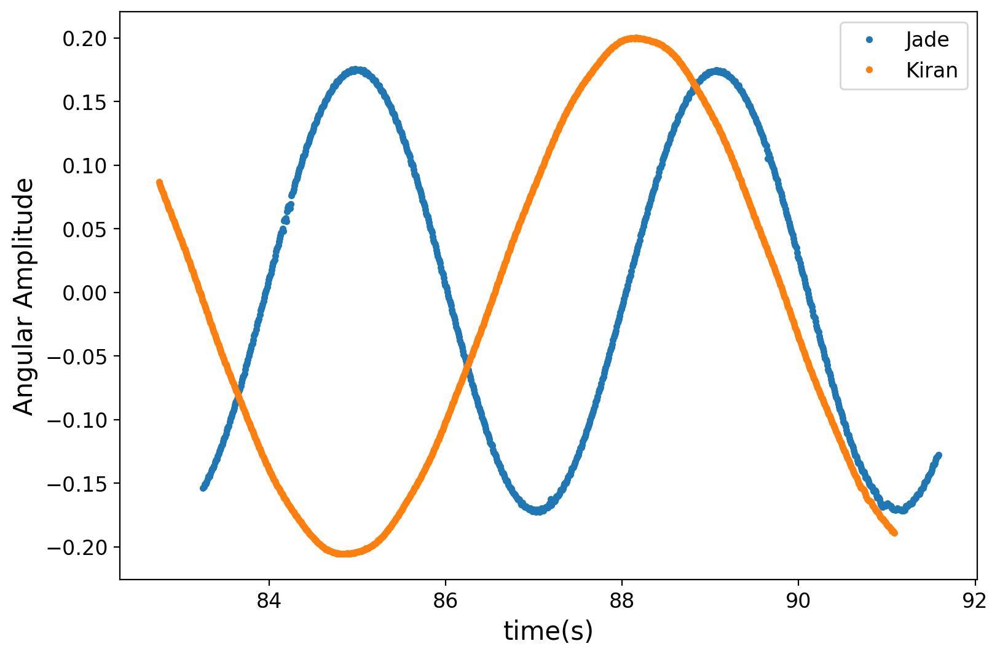

In [21]:
#>>>RUN: L17.6-runcell01

#Jade & Kiran
def load(iFile='data/L17/jade-pendulum.csv'):
    times=np.array([])
    amps =np.array([])
    with open(iFile, newline='') as csvfile:
        line = csv.reader(csvfile, delimiter=' ', quotechar='|')
        for row in line:
            pT=float(row[0])
            pA=float(row[1])
            times=np.append(pT,times)
            amps =np.append(pA,amps)
    #Transform
    amps  = (amps-amps.mean())/(2.*np.max(amps))
    return times,amps

tk,ak=load('data/L17/Kiran.csv')
tj,aj=load()


plt.plot(tj,aj,'.',label='Jade')
plt.plot(tk,ak,'.',label='Kiran')
plt.xlabel('time(s)')
plt.ylabel("Angular Amplitude")
plt.legend()
plt.show()

plt.plot(tj[0:1000],aj[0:1000],'.',label='Jade')
plt.plot(tk[0:1000],ak[0:1000],'.',label='Kiran')
plt.xlabel('time(s)')
plt.ylabel("Angular Amplitude")
plt.legend()
plt.show()

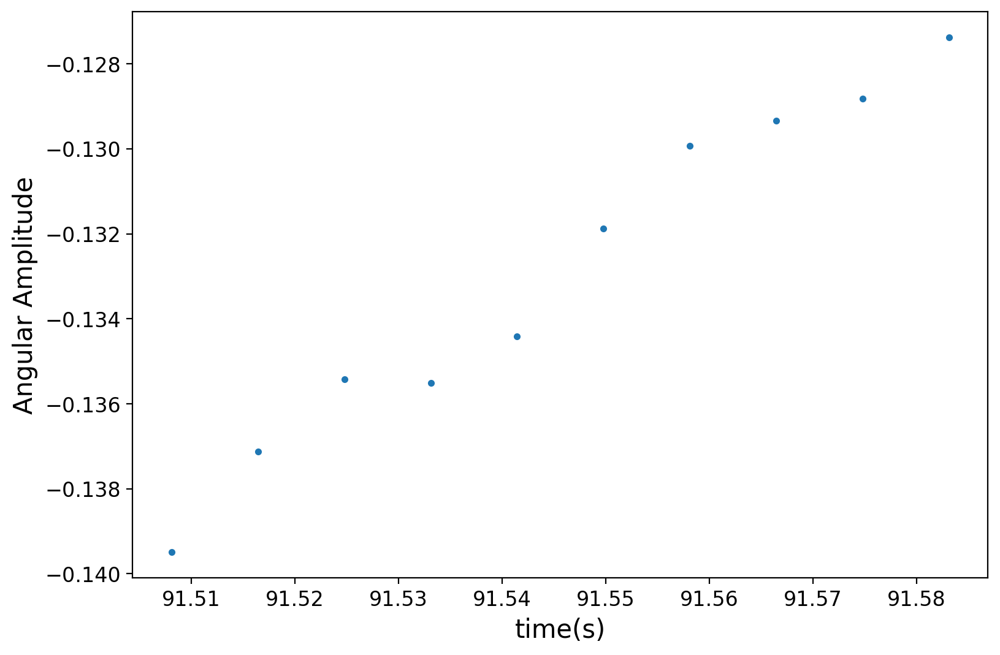

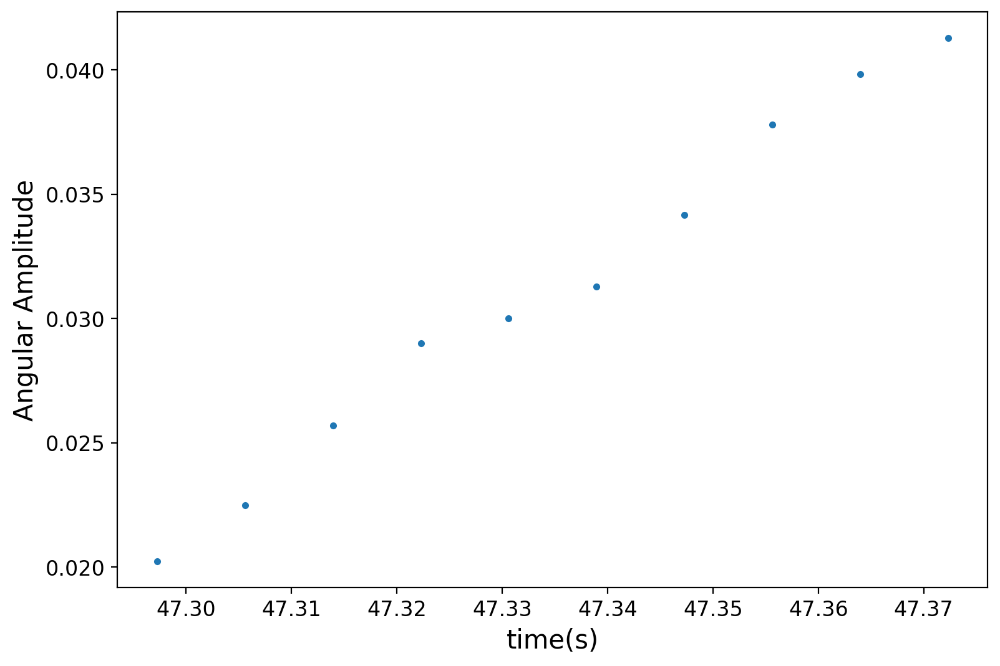

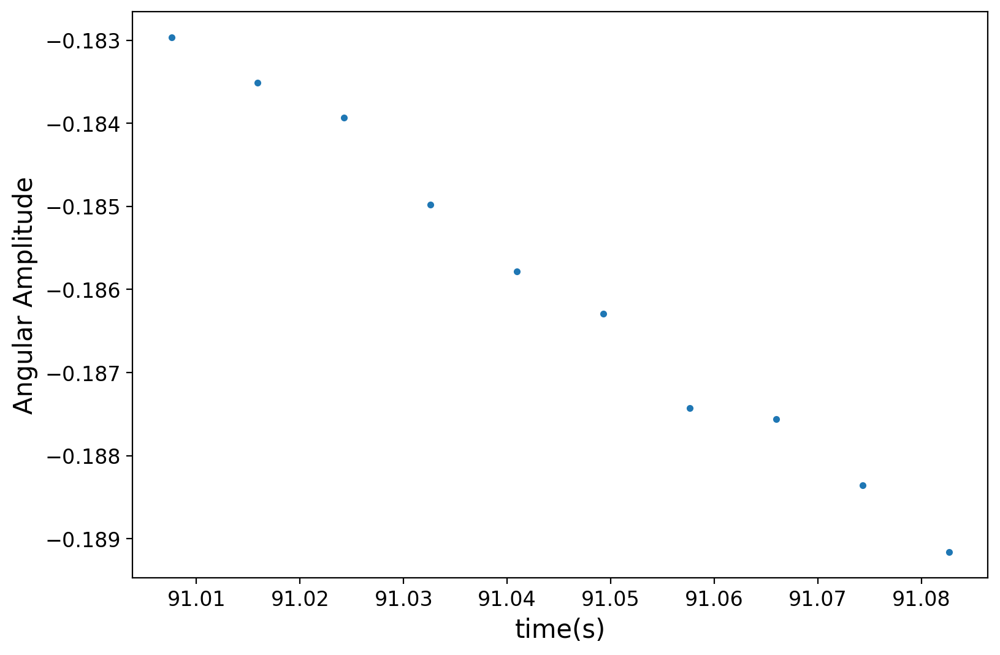

In [22]:
#>>>RUN: L17.6-runcell02

plt.plot(tj[0:10],aj[0:10],'.',label='Jade')
plt.xlabel('time(s)')
plt.ylabel("Angular Amplitude")
plt.show()

plt.plot(tj[5300:5310],aj[5300:5310],'.',label='Jade')
plt.xlabel('time(s)')
plt.ylabel("Angular Amplitude")
plt.show()

plt.plot(tk[0:10],ak[0:10],'.',label='Kiran')
plt.xlabel('time(s)')
plt.ylabel("Angular Amplitude")
plt.show()



[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 7
    # data points      = 10
    # variables        = 2
    chi-square         = 8.05196856
    reduced chi-square = 1.00649607
    Akaike info crit   = 1.83331510
    Bayesian info crit = 2.43848528
    R-squared          = 0.99211498
[[Variables]]
    slope:     -0.08401966 +/- 0.00264823 (3.15%) (init = 1)
    intercept:  7.46358256 +/- 0.24110872 (3.23%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(slope, intercept) = -1.0000


<AxesSubplot:title={'center':'Model(linear)'}, xlabel='x', ylabel='y'>

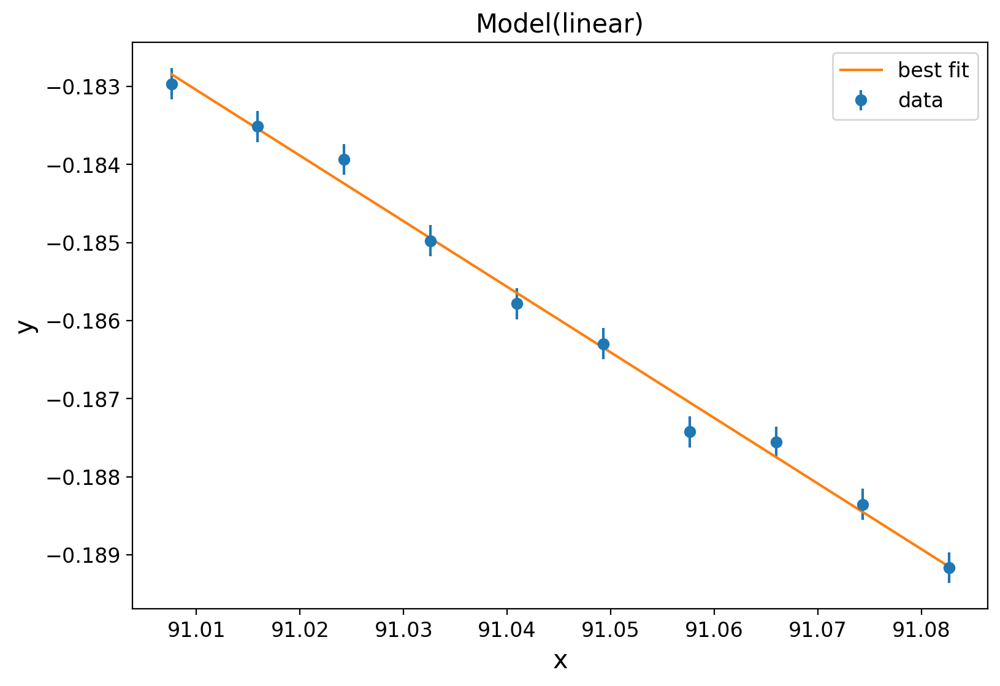

In [23]:
#>>>RUN: L17.6-runcell03

from lmfit import Model, Parameter, report_fit, fit_report
from lmfit.models import LinearModel

model = LinearModel()
pars = model.make_params(intercept=0, slope=0)
result=model.fit(x=tk[0:10],data=ak[0:10],pars=pars,weights=1./(np.ones(10)*2e-4))
print(result.fit_report())
result.plot_fit()

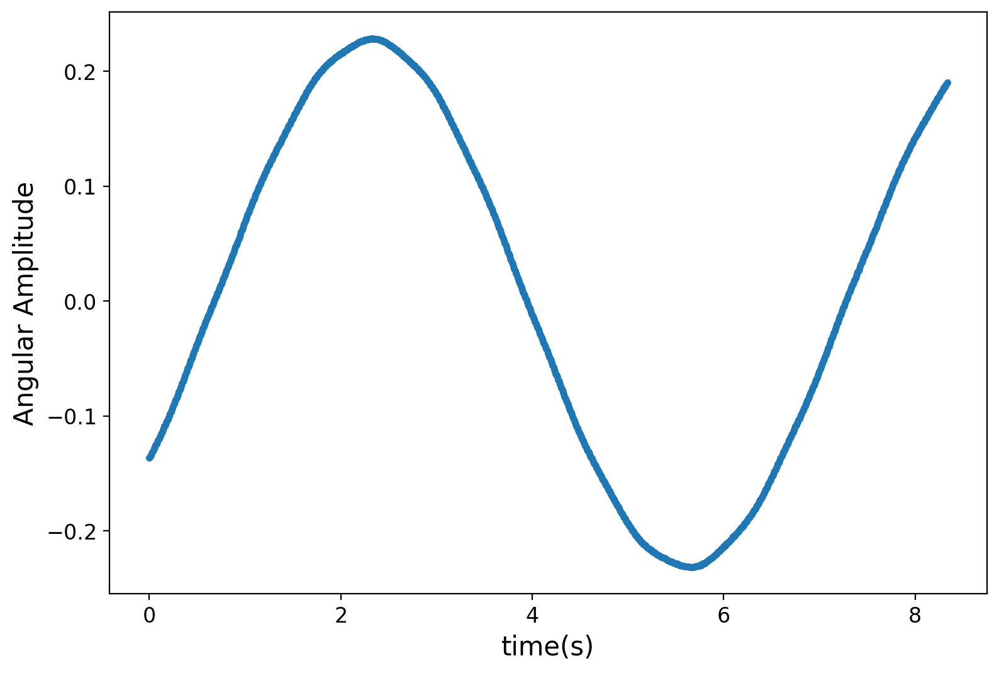

[[Model]]
    Model(func)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 1458
    # data points      = 1000
    # variables        = 6
    chi-square         = 28708.7710
    reduced chi-square = 28.8820634
    Akaike info crit   = 3369.20269
    Bayesian info crit = 3398.64922
    R-squared          = 0.99995001
[[Variables]]
    x0: -0.00576835 +/- 0.81144745 (14067.25%) (init = -0.01)
    x1:  0.00755193 +/- 1.06235497 (14067.33%) (init = 0.01)
    x2:  9.76597513 +/- 0.02946690 (0.30%) (init = 9.8)
    x3:  0.00519446 +/- 4.4423e-04 (8.55%) (init = 0)
    x4:  23.5583649 +/- 3312.54501 (14061.01%) (init = 15)
    x5: -0.00319800 +/- 5.0820e-05 (1.59%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(x1, x4) = -1.0000
    C(x0, x1) = -1.0000
    C(x0, x4) = +1.0000
    C(x0, x2) = -0.9986
    C(x2, x4) = -0.9986
    C(x1, x2) = +0.9986
    C(x2, x3) = +0.8508
    C(x1, x3) = +0.8469
    C(x0, x3) = -0.8469
    C(x3, x4) = -0.84

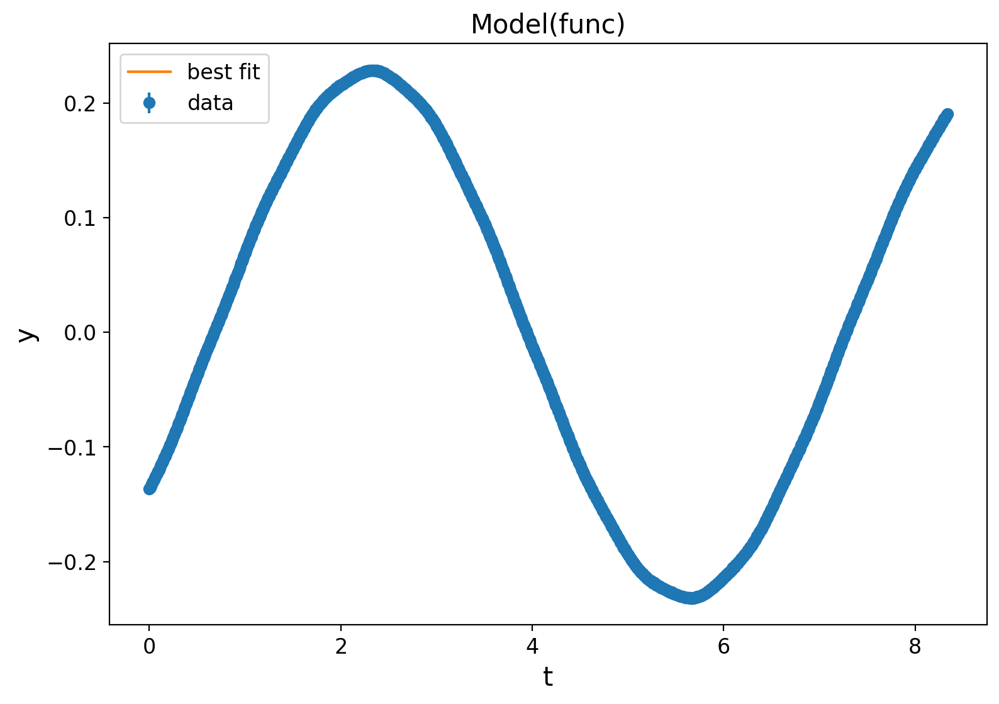

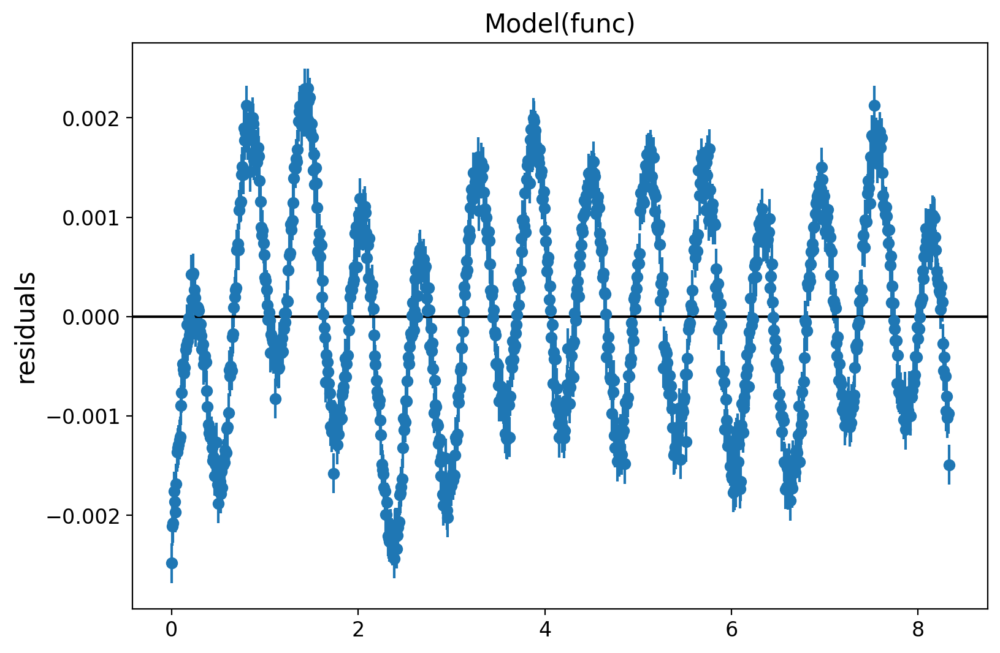

In [24]:
#>>>RUN: L17.6-runcell04

time=np.flip(tk)[0:1000]
amp= np.flip(ak)[0:1000]
weights=1.0/(np.ones(len(amp))*2*1e-4)
lk = 10.7886
lj = 4.151
l=lk

def ffull(y, t, g, l, mu): #This is for ODE
    theta, thetadot = y
    return [thetadot, - (g / l) * np.sin(theta)-mu*thetadot]


def func(t,x0,x1,x2,x3,x4,x5):
    #solution = solve_ivp(ffull,[time[0],time[-1]], [x0, x1], max_step = 0.1, args=(x2,l,x3),t_eval=t)
    #solution = x4*solution.y[0]+x5#np.sin(solution[:,0])+x[5]
    solution = odeint(ffull, [x0,x1,], t, args=(x2,l,x3))
    solution = x4*solution[:,0]+x5
    return solution

plt.plot(time,amp,'.',label='Kiran')
plt.xlabel('time(s)')
plt.ylabel("Angular Amplitude")
plt.show()

xtest = np.array([-0.01,0.01,9.8,0.0,15,0.01])
model = Model(func, independent_vars=['t'])
params = model.make_params()
params['x0'].min=np.min(amp)*2
params['x0'].max=np.max(amp)*2
params['x1'].min=np.min(amp)*10
params['x1'].max=np.max(amp)*10
params['x2'].min=9.5
params['x2'].max=10.0
params['x3'].min=-0.1
params['x3'].max=0.1
params['x4'].min=1
params['x4'].max=100
#params['x4'].vary=False
params['x5'].min=-0.1
params['x5'].max=0.1
#params['x6'].min=-0.5
#params['x6'].max=0.5
#params['x6'].vary=False
result = model.fit(amp, t=time,params=params, weights=weights,
                  x0=xtest[0],x1=xtest[1],x2=xtest[2],x3=xtest[3],x4=xtest[4],x5=xtest[5])
print(result.fit_report())
result.plot_fit()
plt.show()
result.plot_residuals()
plt.show()



[[Model]]
    Model(func)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 129
    # data points      = 100
    # variables        = 6
    chi-square         = 110.962016
    reduced chi-square = 1.18044698
    Akaike info crit   = 22.4017760
    Bayesian info crit = 38.0327971
    R-squared          = 0.99997078
[[Variables]]
    x0: -0.00712614 +/- 0.75335175 (10571.67%) (init = -0.01)
    x1:  0.00933410 +/- 0.98679069 (10571.89%) (init = 0.01)
    x2:  9.76136200 +/- 0.03198501 (0.33%) (init = 9.8)
    x3:  0.00297974 +/- 2.4040e-04 (8.07%) (init = 0)
    x4:  18.9746177 +/- 2004.68981 (10565.11%) (init = 15)
    x5: -0.00303909 +/- 8.8073e-05 (2.90%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(x1, x4) = -1.0000
    C(x0, x4) = +1.0000
    C(x0, x1) = -1.0000
    C(x0, x2) = -0.9996
    C(x2, x4) = -0.9996
    C(x1, x2) = +0.9996
    C(x1, x3) = +0.9185
    C(x0, x3) = -0.9185
    C(x3, x4) = -0.9185
    C(x2, x3) = +0.9184

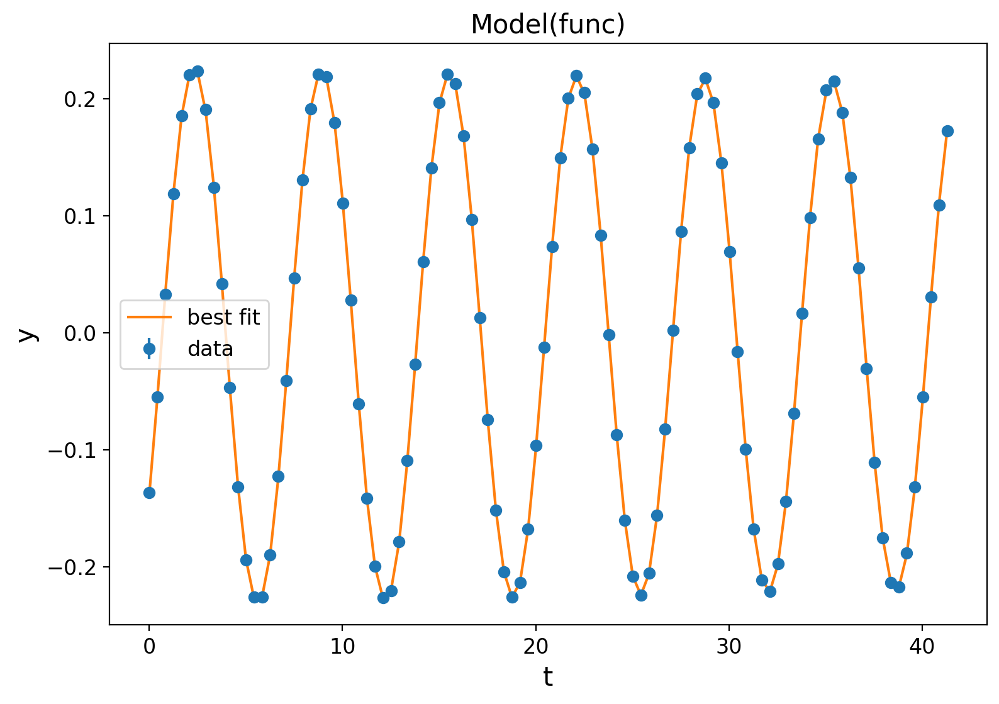

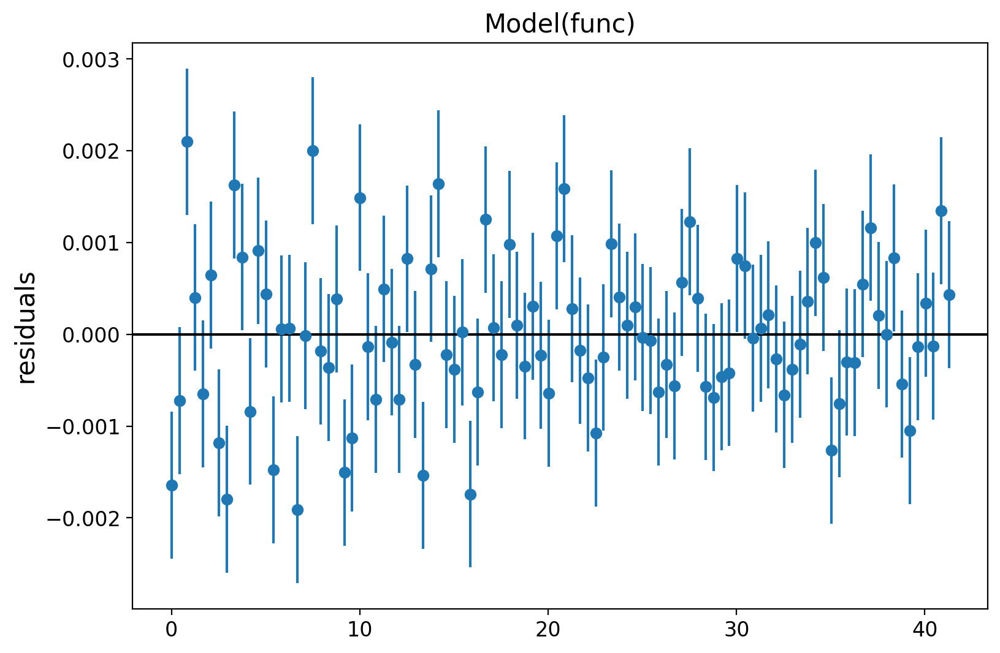

In [25]:
#>>>RUN: L17.6-runcell05

time=np.flip(tk)[0:5000][::50]
amp= np.flip(ak)[0:5000][::50]
weights=1/(np.ones(len(amp))*8*1e-4) #inflate uncertainty
lk = 10.7886
lj = 4.151
l=lk
result = model.fit(amp, t=time,params=params, weights=weights,
                  x0=xtest[0],x1=xtest[1],x2=xtest[2],x3=xtest[3],x4=xtest[4],x5=xtest[5])
print(result.fit_report())
result.plot_fit()
plt.show()
result.plot_residuals()
plt.show()




[[Model]]
    Model(func)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 31
    # data points      = 250
    # variables        = 5
    chi-square         = 263.508679
    reduced chi-square = 1.07554563
    Akaike info crit   = 23.1563471
    Bayesian info crit = 40.7636517
    R-squared          = 0.99996951
[[Variables]]
    x0:  0.01053889 +/- 7.5180e-06 (0.07%) (init = -0.01)
    x1:  0.00228810 +/- 7.2058e-06 (0.31%) (init = 0.01)
    x2:  9.76080130 +/- 6.0941e-04 (0.01%) (init = 9.8)
    x3:  0.00285977 +/- 5.8481e-05 (2.04%) (init = 0)
    x4:  20 (fixed)
    x5: -0.00295026 +/- 5.2681e-05 (1.79%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(x1, x2) = +0.8519
    C(x0, x3) = +0.8379
    C(x0, x2) = -0.2505
    C(x0, x1) = -0.1016


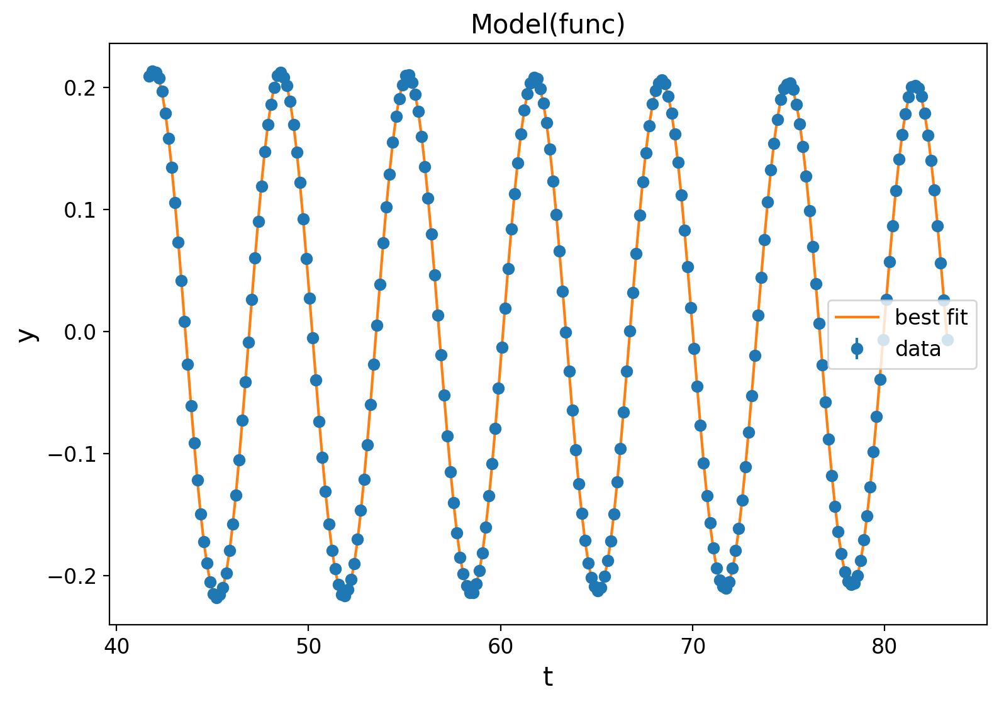

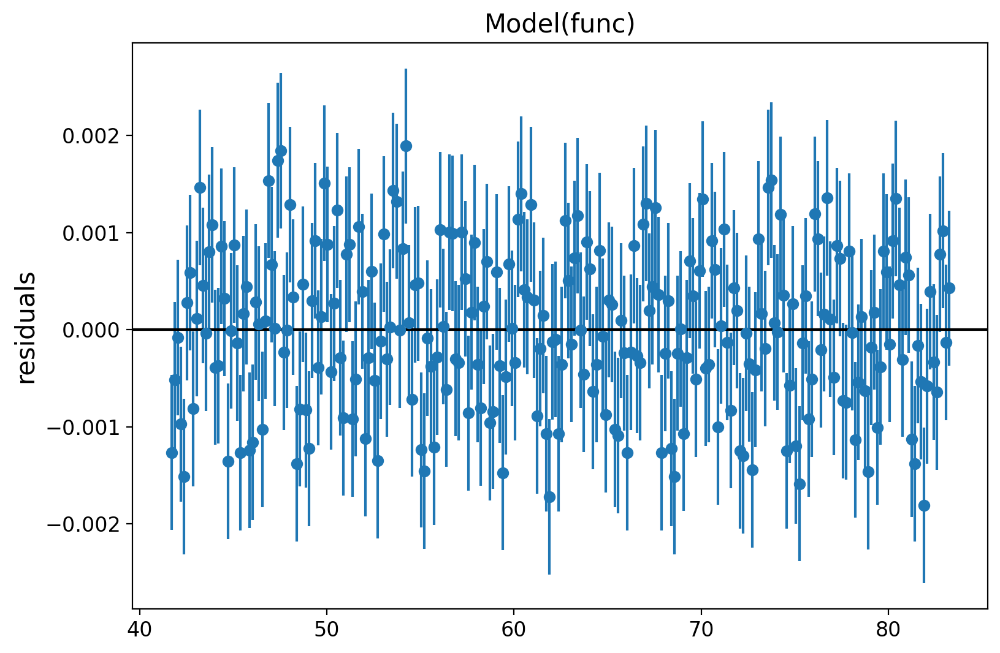

[[Model]]
    Model(func)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 31
    # data points      = 250
    # variables        = 5
    chi-square         = 397.579299
    reduced chi-square = 1.62277265
    Akaike info crit   = 125.983373
    Bayesian info crit = 143.590677
    R-squared          = 0.99993682
[[Variables]]
    x0: -0.00729163 +/- 9.1576e-06 (0.13%) (init = -0.01)
    x1: -0.00849054 +/- 1.4360e-05 (0.17%) (init = 0.01)
    x2:  9.83558299 +/- 5.6111e-04 (0.01%) (init = 9.8)
    x3:  0.00253695 +/- 8.2920e-05 (3.27%) (init = 0)
    x4:  20 (fixed)
    x5:  0.00204814 +/- 6.4593e-05 (3.15%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(x1, x2) = -0.7236
    C(x0, x3) = -0.6709
    C(x0, x2) = +0.5314
    C(x1, x3) = -0.4817


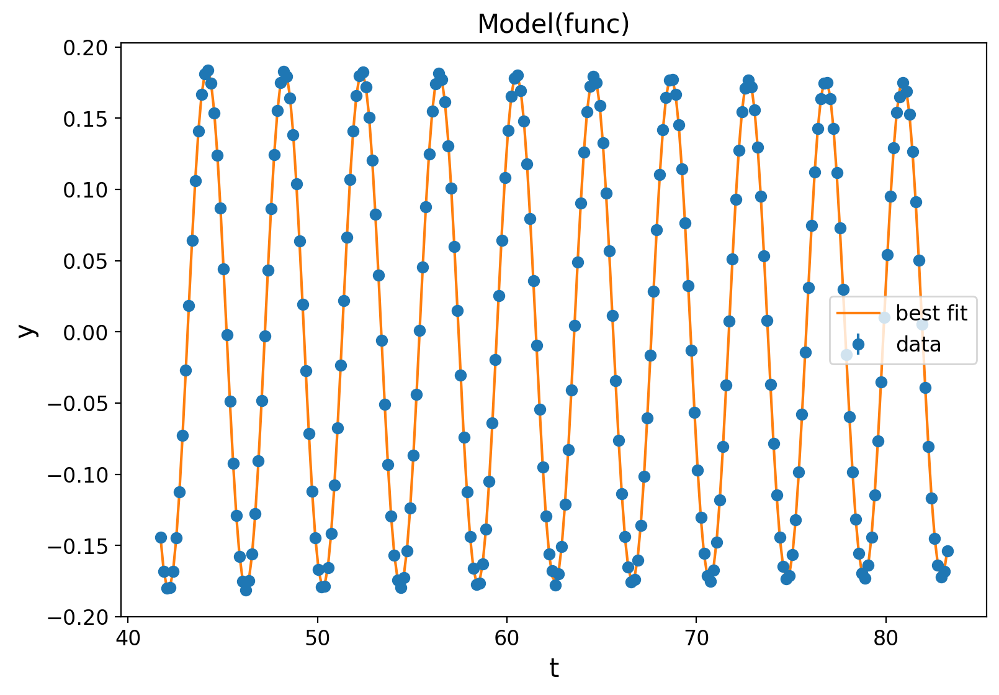

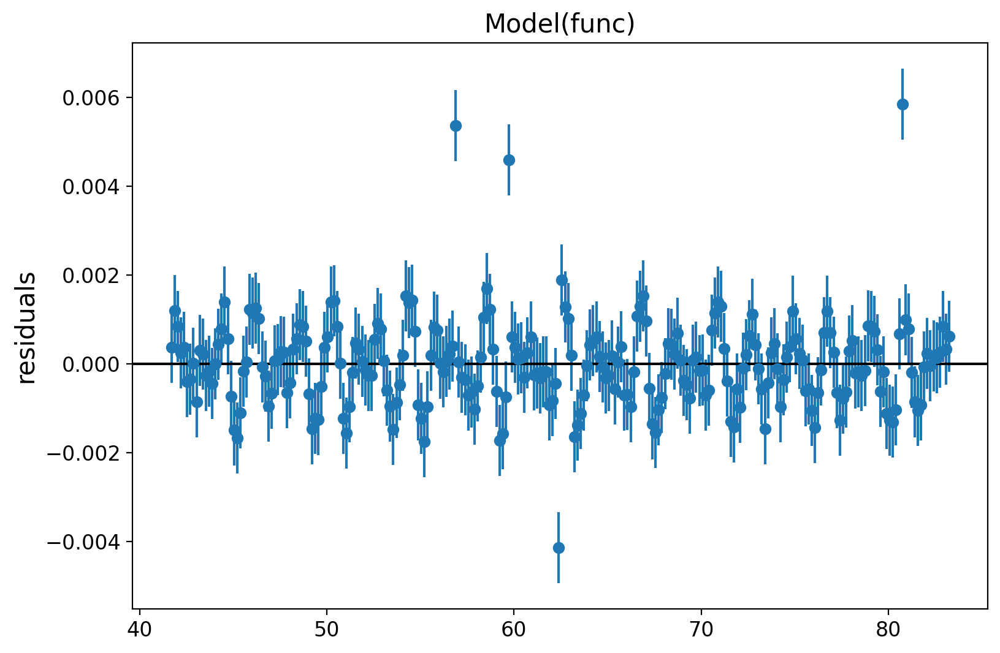

In [26]:
#>>>RUN: L17.6-runcell06

time=np.flip(tk)[5000:10000][::20]
amp= np.flip(ak)[5000:10000][::20]
weights=1/(np.ones(len(amp))*8*1e-4) #inflate uncertainty
lk = 10.7886
lj = 4.151
l=lk
xtest[4]=20
params['x4'].vary=False
result = model.fit(amp, t=time,params=params, weights=weights,
                  x0=xtest[0],x1=xtest[1],x2=xtest[2],x3=xtest[3],x4=xtest[4],x5=xtest[5])
print(result.fit_report())
result.plot_fit()
plt.show()
result.plot_residuals()
plt.show()

time=np.flip(tj)[5000:10000][::20]
amp= np.flip(aj)[5000:10000][::20]
weights=1/(np.ones(len(amp))*8*1e-4) #inflate uncertainty
lk = 10.7886
lj = 4.151
l=lj
xtest[4]=20
params['x4'].vary=False
result = model.fit(amp, t=time,params=params, weights=weights,
                  x0=xtest[0],x1=xtest[1],x2=xtest[2],x3=xtest[3],x4=xtest[4],x5=xtest[5])

print(result.fit_report())
result.plot_fit()
plt.show()
result.plot_residuals()
plt.show()




In [27]:
#>>>RUN: L17.6-runcell07

def ffull(y, t, g, l, mu, drag): #This is for ODE
    theta, thetadot = y
    return [thetadot, - (g / l) * np.sin(theta)-mu*thetadot-drag*thetadot**2 ]


def func(t,x0,x1,x2,x3,x4,x5,x6):
    #solution = solve_ivp(ffull,[time[0],time[-1]], [x0, x1], max_step = 0.1, args=(x2,l,x3),t_eval=t)
    #solution = x4*solution.y[0]+x5#np.sin(solution[:,0])+x[5]
    solution = odeint(ffull, [x0,x1,], t, args=(x2,l,x3,x6))
    solution = (x4*solution[:,0]+x5)
    return solution


xtest = np.array([-0.01,0.01,9.8,0.0,20,0.01,0.0,0])
model = Model(func, independent_vars=['t'])
params = model.make_params()
params['x0']
params['x0'].min=np.min(amp)
params['x0'].max=np.max(amp)
params['x1'].min=np.min(amp)*10
params['x1'].max=np.max(amp)*10
params['x2'].min=9.5
params['x2'].max=10.0
params['x3'].min=-0.1
params['x3'].max=0.1
params['x4'].min=1
params['x4'].max=100
params['x4'].vary=False
params['x5'].min=-0.1
params['x5'].max=0.1
params['x6'].min=-10.5
params['x6'].max=10.5
#params['x7'].min=-0.1
#params['x7'].max=0.1
#params['x6'].vary=False



[[Model]]
    Model(func)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 29
    # data points      = 1000
    # variables        = 6
    chi-square         = 928.231559
    reduced chi-square = 0.93383457
    Akaike info crit   = -62.4740523
    Bayesian info crit = -33.0275206
    R-squared          = 0.99997444
[[Variables]]
    x0: -0.00668450 +/- 6.3073e-06 (0.09%) (init = -0.01)
    x1:  0.00880305 +/- 4.8295e-06 (0.05%) (init = 0.01)
    x2:  9.76170542 +/- 1.5345e-04 (0.00%) (init = 9.8)
    x3:  0.00288775 +/- 1.3429e-05 (0.47%) (init = 0)
    x4:  20 (fixed)
    x5: -0.00438139 +/- 1.0232e-04 (2.34%) (init = 0.01)
    x6: -1.17425255 +/- 0.08494693 (7.23%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(x5, x6) = +0.9709
    C(x0, x6) = -0.8314
    C(x0, x5) = -0.8084
    C(x1, x6) = +0.7140
    C(x1, x5) = +0.6881
    C(x1, x2) = -0.6385
    C(x0, x1) = -0.6056
    C(x1, x3) = +0.5325
    C(x2, x6) = -0.4798
    C(x2, x5) 

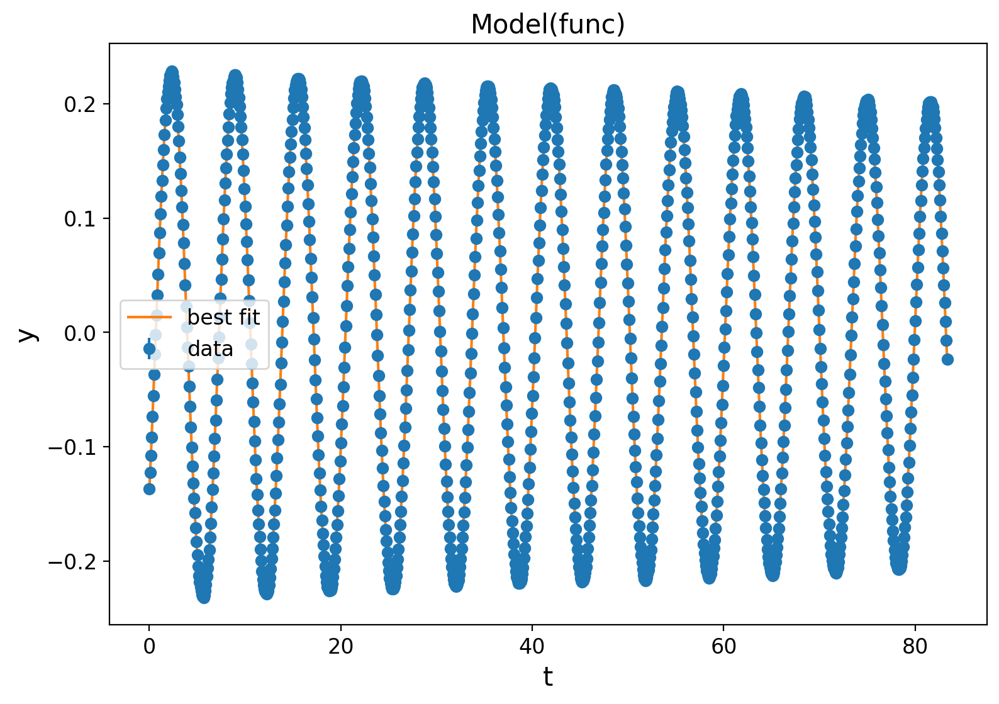

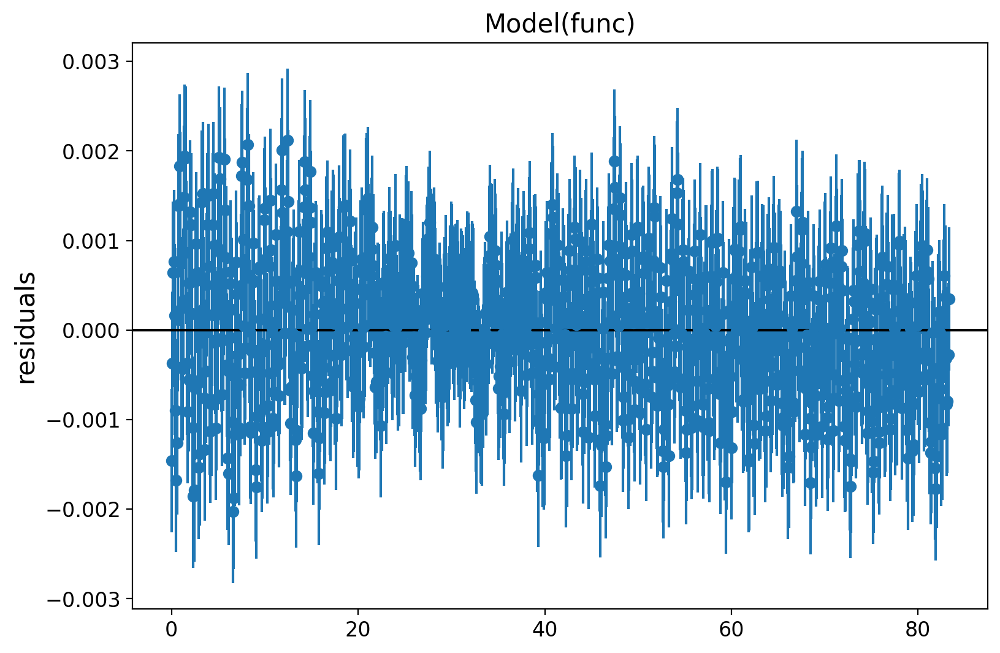

[[Model]]
    Model(func)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 87
    # data points      = 500
    # variables        = 6
    chi-square         = 506.146539
    reduced chi-square = 1.02458814
    Akaike info crit   = 18.1090662
    Bayesian info crit = 43.3967148
    R-squared          = 0.99995980
[[Variables]]
    x0: -0.00740467 +/- 5.5220e-06 (0.07%) (init = -0.01)
    x1: -0.00859406 +/- 8.1723e-06 (0.10%) (init = 0.01)
    x2:  9.83738161 +/- 3.2476e-04 (0.00%) (init = 9.8)
    x3:  0.00250032 +/- 5.7419e-05 (2.30%) (init = 0)
    x4:  20 (fixed)
    x5:  0.00406214 +/- 3.6505e-05 (0.90%) (init = 0.01)
    x6:  2.51843677 +/- 0.01140922 (0.45%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(x0, x3) = -0.6846
    C(x1, x2) = -0.6737
    C(x0, x2) = +0.5498
    C(x3, x6) = -0.4794
    C(x1, x3) = -0.4311
    C(x2, x6) = +0.2760
    C(x0, x6) = +0.1579
    C(x2, x3) = -0.1480


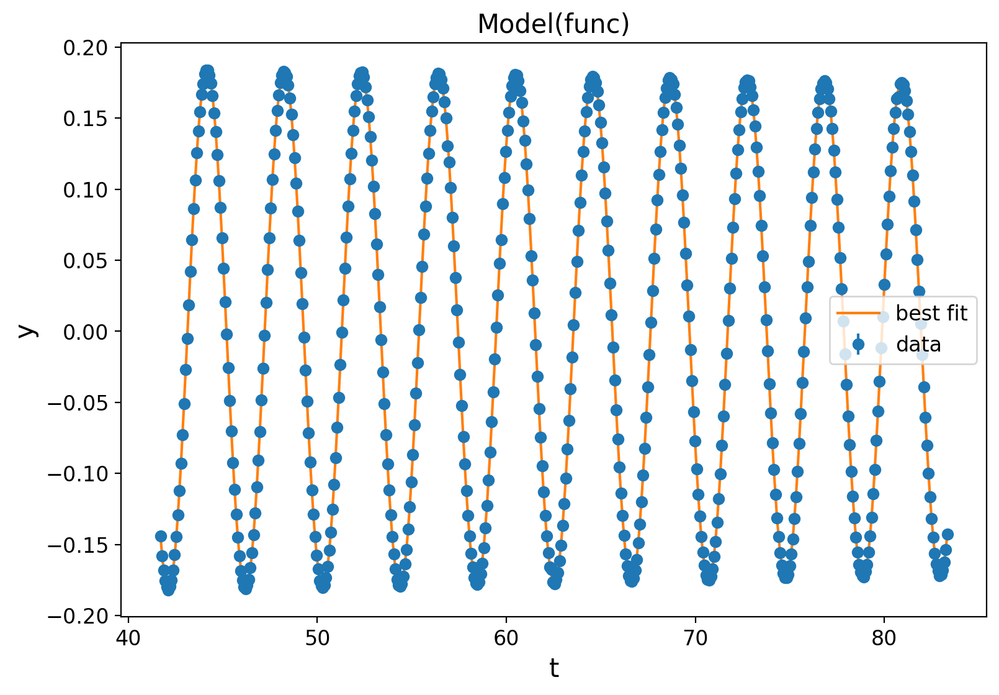

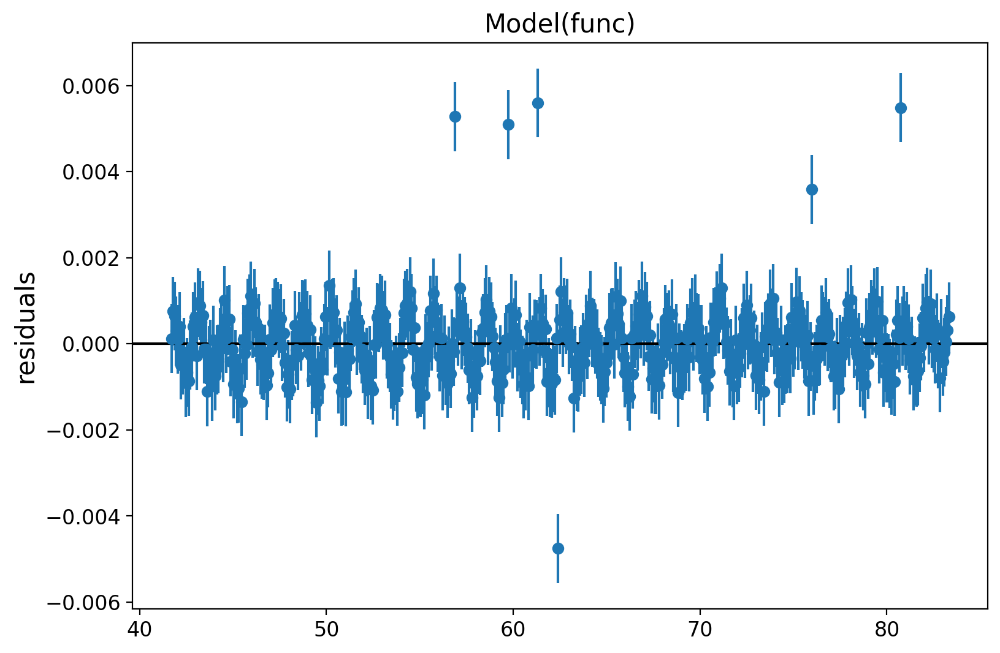

9.80348820582177

In [28]:
#>>>RUN: L17.6-runcell08

time=np.flip(tk)[0:10000][::10]
amp= np.flip(ak)[0:10000][::10]
weights=1/(np.ones(len(amp))*8*1e-4) #inflate uncertainty
lk = 10.7886
lj = 4.151
l=lk
xtest[4]=20
params['x4'].vary=False
result = model.fit(amp, t=time,params=params, weights=weights,
                  x0=xtest[0],x1=xtest[1],x2=xtest[2],x3=xtest[3],x4=xtest[4],x5=xtest[5],x6=xtest[6])#,x7=xtest[7])
print(result.fit_report())
result.plot_fit()
plt.show()
result.plot_residuals()
plt.show()

time=np.flip(tj)[5000:10000][::10]
amp= np.flip(aj)[5000:10000][::10]
weights=1/(np.ones(len(amp))*8*1e-4) #inflate uncertainty
lk = 10.7886
lj = 4.151
l=lj
xtest[4]=20
params['x4'].vary=False
result = model.fit(amp, t=time,params=params, weights=weights,
                  x0=xtest[0],x1=xtest[1],x2=xtest[2],x3=xtest[3],x4=xtest[4],x5=xtest[5],x6=xtest[6])#,x7=xtest[7])

print(result.fit_report())
result.plot_fit()
plt.show()
result.plot_residuals()
plt.show()

def gtrue(phi):
    return 9.80616-0.025925*np.cos(2*phi)+0.000069*np.cos(phi)**2

gtrue(42./180.*np.pi)


<a name='exercises_17_6'></a>     

| [Top](#section_17_0) | [Restart Section](#section_17_6) |


### <span style="border:3px; border-style:solid; padding: 0.15em; border-color: #90409C; color: #90409C;">Exercise 17.6.1</span>

Repeat the fit to both datasets using the exact solution for a damped harmonic oscillator, defined as `dampfunc` in the code below. The analytic form of the solution is:

$$
\theta(t) = Be^{-\frac{\mu'}{2}t}\cos(\omega_t t + \delta)
$$

where $B$ and $\delta$ are parameters set based on intial conditionas, and the frequency of transient oscillations is given by:

$$
\omega_t = \sqrt{\omega_0^2 - \left(\frac{\mu'}{2}\right)^2}
$$

As with the model used in this section, you should add an additional offset term, such that the fit model resembles:

$$
\theta(t) = Be^{-\frac{\mu'}{2}t}\cos(\omega_t t + \delta) + \Delta
$$


What values do you obtain for $g$ for both data sets? Report your result as a list of two numbers with precision `1e-4`.

[[Model]]
    Model(dampfunc)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 45
    # data points      = 1000
    # variables        = 5
    chi-square         = 1105.91615
    reduced chi-square = 1.11147352
    Akaike info crit   = 110.674086
    Bayesian info crit = 135.212862
    R-squared          = 0.99996955
[[Variables]]
    x0: -0.22982590 +/- 7.8775e-05 (0.03%) (init = -0.01)
    x1:  0.94225267 +/- 3.3339e-04 (0.04%) (init = 0.01)
    x2:  9.76100890 +/- 1.4690e-04 (0.00%) (init = 9.8)
    x3:  0.00289972 +/- 1.4668e-05 (0.51%) (init = 0)
    x4: -0.00300788 +/- 2.6694e-05 (0.89%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(x0, x3) = -0.8599
    C(x1, x2) = -0.8541


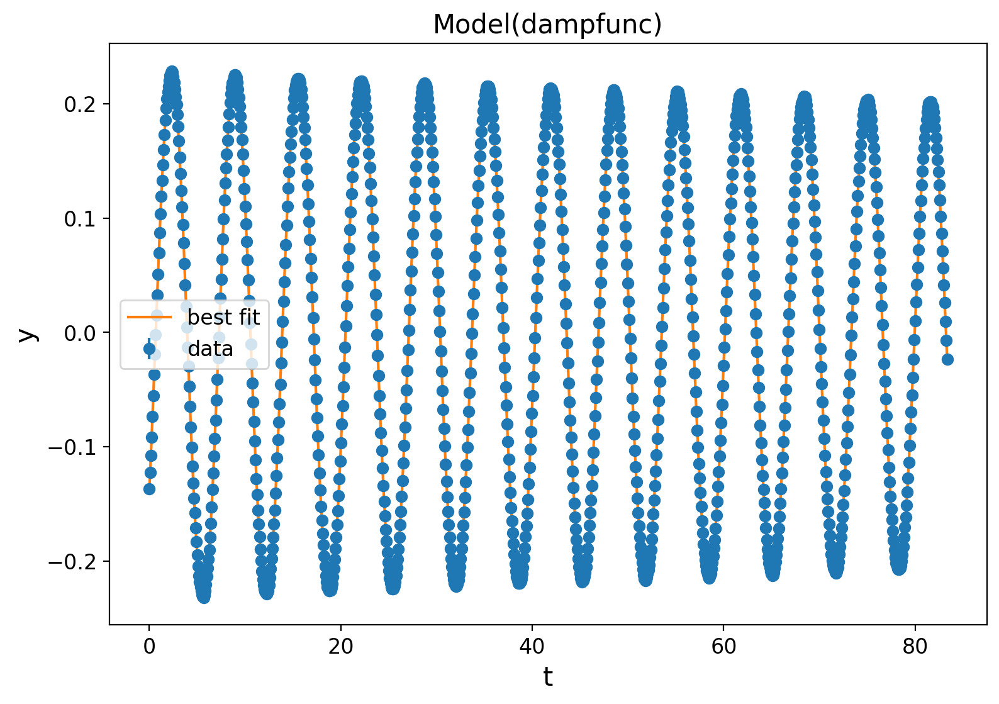

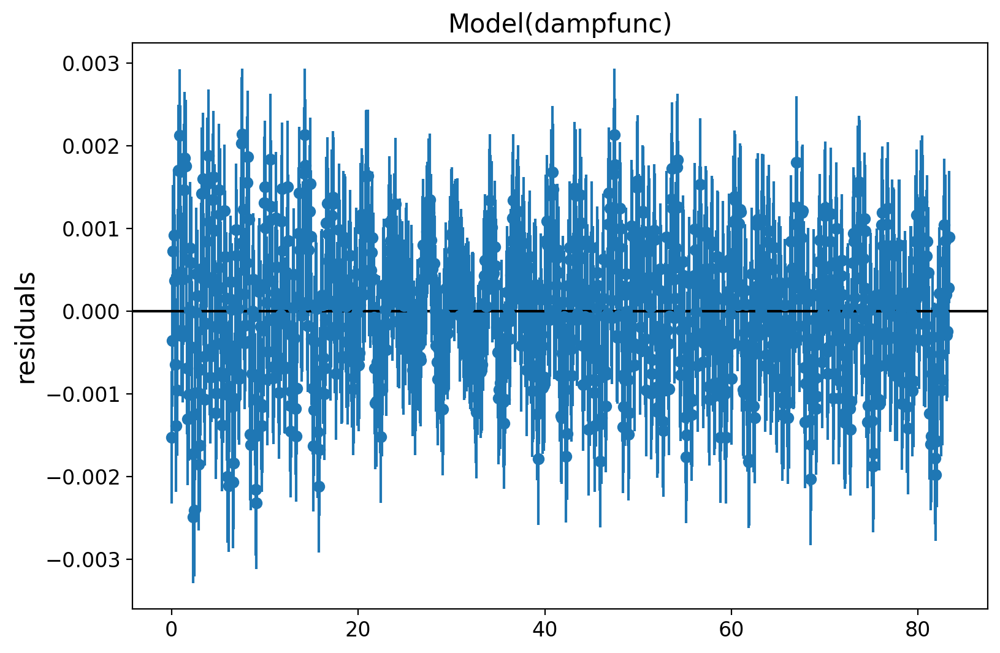

[[Model]]
    Model(dampfunc)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 68
    # data points      = 1000
    # variables        = 5
    chi-square         = 1427.03328
    reduced chi-square = 1.43420430
    Akaike info crit   = 365.597658
    Bayesian info crit = 390.136434
    R-squared          = 0.99994544
[[Variables]]
    x0: -0.19249317 +/- 8.8304e-05 (0.05%) (init = -0.01)
    x1: -2.01893970 +/- 4.5389e-04 (0.02%) (init = 0.01)
    x2:  9.83574329 +/- 1.2442e-04 (0.00%) (init = 9.8)
    x3:  0.00246431 +/- 1.9462e-05 (0.79%) (init = 0)
    x4:  0.00203101 +/- 3.0305e-05 (1.49%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(x0, x3) = -0.8599
    C(x1, x2) = -0.8567


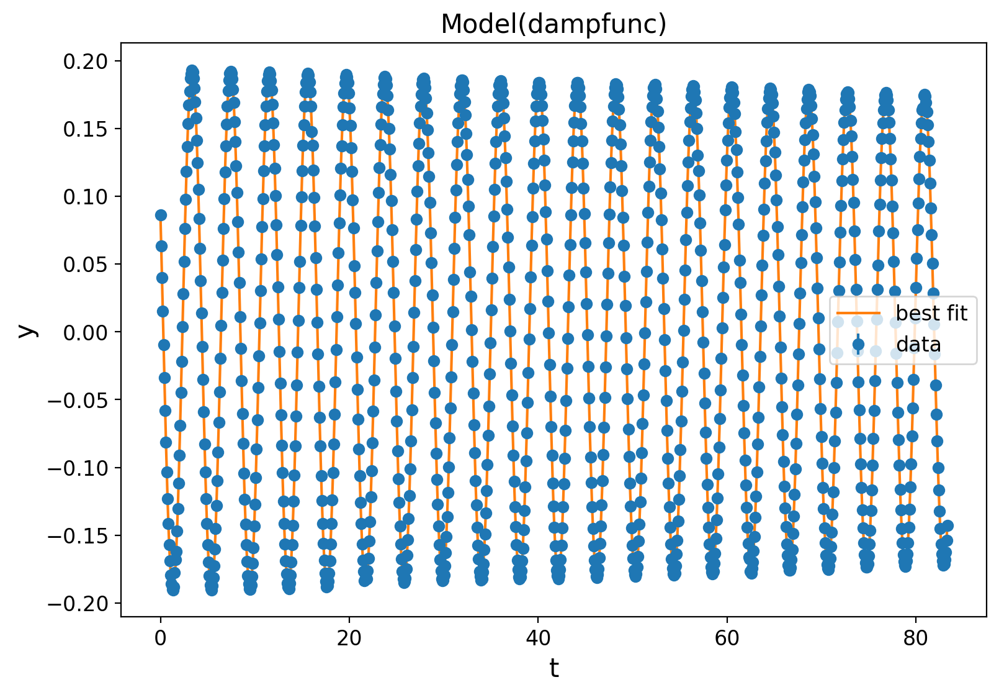

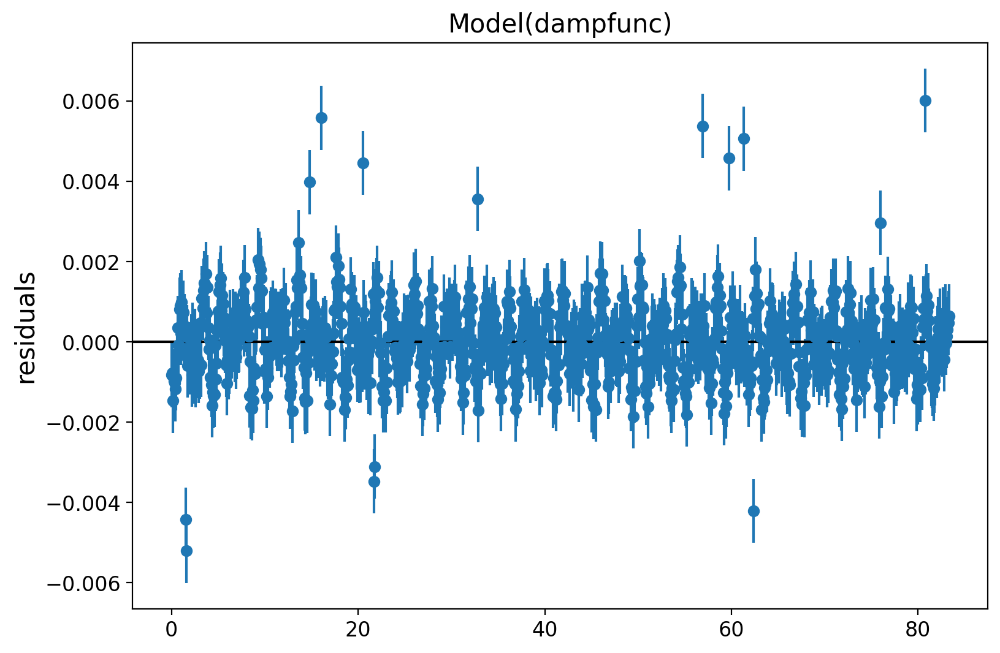

In [29]:
#>>>EXERCISE: L17.6.1

def dampfunc(t,x0,x1,x2,x3,x4):
    omegat = np.sqrt( (x2/l) - (x3/2.)**2.)
    return x0*np.exp(-t*x3/2.)*np.cos(omegat*t+x1)+x4


dampmodel = Model(dampfunc, independent_vars=['t'])
params = dampmodel.make_params()

xtest = np.array([-0.01, 0.01, 9.8, 0.0, 20, 0.01, 0.0,0]) #FILL IN ARRAY
#SET MIN/MAX ON PARAM VALS HERE
params['x0'].min = np.min(amp*10)
params['x0'].max = np.max(amp*10)
params['x1'].min = -2*np.pi
params['x1'].max = 2*np.pi
params['x2'].min = 9.5
params['x2'].max = 10
params['x3'].min = -0.1
params['x3'].max = 0.1
params['x4'].min = -0.1
params['x4'].max = 0.1
#params['x4'].vary = False
#params['x5'].min = -0.1
#params['x5'].max = 0.1
#params['x6'].min = -10.5
#params['x6'].max = 10.5



time=np.flip(tk)[0:10000][::10]
amp= np.flip(ak)[0:10000][::10]
weights=1/(np.ones(len(amp))*8*1e-4) #inflate uncertainty
lk = 10.7886
lj = 4.151
l=lk
result = dampmodel.fit(amp, t=time,params=params, weights=weights,
                      x0=xtest[0],x1=xtest[1],x2=xtest[2],x3=xtest[3],x4=xtest[5])
print(result.fit_report())
result.plot_fit()
plt.show()
result.plot_residuals()
plt.show()

time=np.flip(tj)[0:10000][::10]
amp= np.flip(aj)[0:10000][::10]
weights=1/(np.ones(len(amp))*8*1e-4) #inflate uncertainty
lk = 10.7886
lj = 4.151
l=lj
result = dampmodel.fit(amp, t=time,params=params, weights=weights,
                      x0=xtest[0],x1=xtest[1],x2=xtest[2],x3=xtest[3],x4=xtest[5])

print(result.fit_report())
result.plot_fit()
plt.show()
result.plot_residuals()
plt.show()